In [1]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-colorblind')   

import numpy as np
import datetime
import networkx as nx
import pandas as pd

from utils_graphs import *
from utils_data_vis import *

In [2]:
datasets_folder = "datasets/csvs/"
graphs_folder = "graphs/"
measures_folder = "measures/"
plots_folder = "plots/latex/"

In [3]:
hour_window_15m = 1

# Análisis Exploratorio de Datos (EDA) y creación de grafos

## Número de usuarios y hashtags únicos por hora

In [4]:
df_15m = read_data("15m", datasets_folder=datasets_folder)
print("15M: número de usuarios únicos:", df_15m["user"].unique().shape[0], ", hashtags únicos:", df_15m["hashtag"].unique().shape[0], ", horas únicas:", df_15m["hour"].unique().shape[0], "en el conjunto de datos.\n")

15M: número de usuarios únicos: 78080 , hashtags únicos: 22375 , horas únicas: 725 en el conjunto de datos.



In [5]:
hour_15m = np.sort(df_15m["hour"].unique())[::hour_window_15m]
# Convierto la hora a formato año, mes, día, hora
hour_15m_dt = [datetime.datetime.fromtimestamp(int(hour)*3600, tz=datetime.timezone.utc).strftime("%Y-%m-%d %H") for hour in hour_15m]

In [6]:
# Añado el numero de usuarios y hashtags únicos a sendos arrays
num_users_15m, num_hashtags_15m = get_num_users_hashtags(df_15m, hour_window=hour_window_15m)

## Creación de redes por hora

In [8]:
#Creamos grafos de la manifestación del 15M
manifestacion = "15m"

#create_graphs("hashtag", "user", df_15m, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_15m)

#create_graphs("user", "hashtag", df_15m, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_15m)

#create_bipartite_graph(df_15m, manifestacion, graphs_folder=graphs_folder, hour_window=hour_window_15m)

Creando redes de hashtag unidos si comparten uno o más user , manifestación seleccionada: 15m número de horas:  725.0


100%|██████████| 725/725 [01:40<00:00,  7.23it/s] 


Creando redes bipartitas, manifestación seleccionada: 15m número de horas:  725.0


100%|██████████| 725/725 [00:11<00:00, 65.85it/s] 


## Número  de nodos y aristas en los grafos generados por hora

In [9]:
# Se leen los grafos creados para cada hora y se almacena el número de nodos y de aristas de cada uno
num_nodes_15m, num_edges_15m = get_num_nodes_edges(hour_15m, node_type="bipartite", manifestacion="15m", hour_window=hour_window_15m)

100%|██████████| 725/725 [00:12<00:00, 57.59it/s]  


## Coeficiente de anidamiento y modularidad por ventana horaria

In [10]:
# Redes bipartitas
hour_sort_15m_b, mod_sort_15m_b, nest_sort_15m_b = get_mod_nest_coefficient("15m", "b", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_15m)
hour_sort_15m_h, mod_sort_15m_h, nest_sort_15m_h = get_mod_nest_coefficient("15m", "h", measures_foler=measures_folder, datasets_foler=datasets_folder, graphs_folder=graphs_folder, hour_window=hour_window_15m)

Calculando el anidamiento y modularidad de 15m con criterio: b


100%|██████████| 725/725 [02:19<00:00,  5.21it/s] 


Calculando el anidamiento y modularidad de 15m con criterio: h


100%|██████████| 725/725 [00:10<00:00, 67.08it/s] 


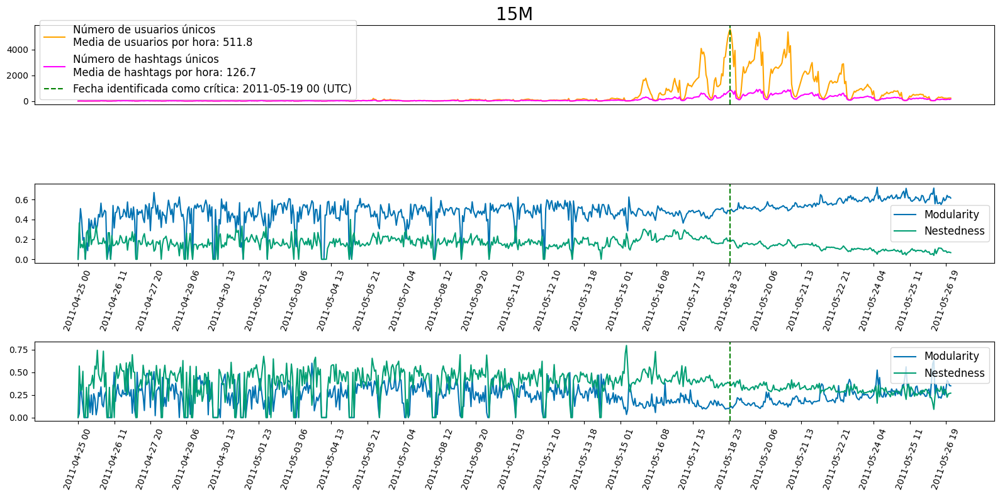

In [19]:
fig, axs = plt.subplots(3, 1)
axs = axs.flat
fig.set_size_inches(16,8)


plot_num_users_hashtags(axs[0], hour_15m_dt, hour_window_15m, num_users_15m, num_hashtags_15m, title="15M", inicio=0, legend=True, HORA_CRITICA=362712)
plot_mod_nestedness(axs[1], hour_15m_dt, hour_window_15m, mod_sort_15m_b, nest_sort_15m_b, inicio=0, legend=True, tick_split=30, HORA_CRITICA=362712)
plot_mod_nestedness(axs[2], hour_15m_dt, hour_window_15m, mod_sort_15m_h, nest_sort_15m_h, inicio=0, legend=True, tick_split=30, HORA_CRITICA=362712)

plt.tight_layout()
plt.savefig(plots_folder + "15m_num_unique_users_coef_mod.png")
plt.show()


## Función de Distribución de Probabilidad (PDF) y Función de Distribución Cumulativa Complementaria (CCDF) de las horas críticas

In [12]:
HORA_CRITICA_15m = "362712"

In [13]:
#15M
plfit_15m, arr_pdf_points_15m, arr_ccdf_points_15m = calc_degree_distribution(HORA_CRITICA_15m, "15m/" + str(hour_window_15m) + '/', mode="b", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, read=False)

100%|██████████| 1/1 [00:00<00:00,  9.32it/s]

Calculating best minimal value for power law fit


# AUTOSIMILITUD EN LAS REDES

## Grado medio por Kt

In [14]:
# MAX_UMBRAL es el máximo K_T que se va a usar para generar subgrafos
MAX_UMBRAL = 200
dict_hora_15m = get_dict_hora_kt("15m", HORA_CRITICA_15m, hour_window=hour_window_15m, node_type="bipartite", MAX_UMBRAL=MAX_UMBRAL)

 10%|█         | 20/200 [00:00<00:02, 76.54it/s]


## Autosimilitud

In [15]:
# Seleccionamos el fichero correspondiente a la manifestación social de la que queremos sacar la red y seleccionamos la hora que queremos estudiar
dict_thres_avg_clust_15m_h, dict_norm_int_deg_15m_h = calc_self_sim(HORA_CRITICA_15m, MAX_UMBRAL, f"15m/{str(hour_window_15m)}/", mode="b")

 10%|█         | 20/200 [00:09<01:21,  2.22it/s]


In [16]:
limit_kt_15m = 10
arr_kt_plot_15m = [0,1,2,3,4,5]

In [17]:
_, arr_deg_prob_15m, arr_deg_comp_cum_15m = calc_degree_distribution(HORA_CRITICA_15m, "15m/" + str(hour_window_15m) + '/', mode="h", measures_folder=measures_folder, arr_kt=arr_kt_plot_15m, exp=False, norm=True)

100%|██████████| 6/6 [00:00<00:00, 141.36it/s]


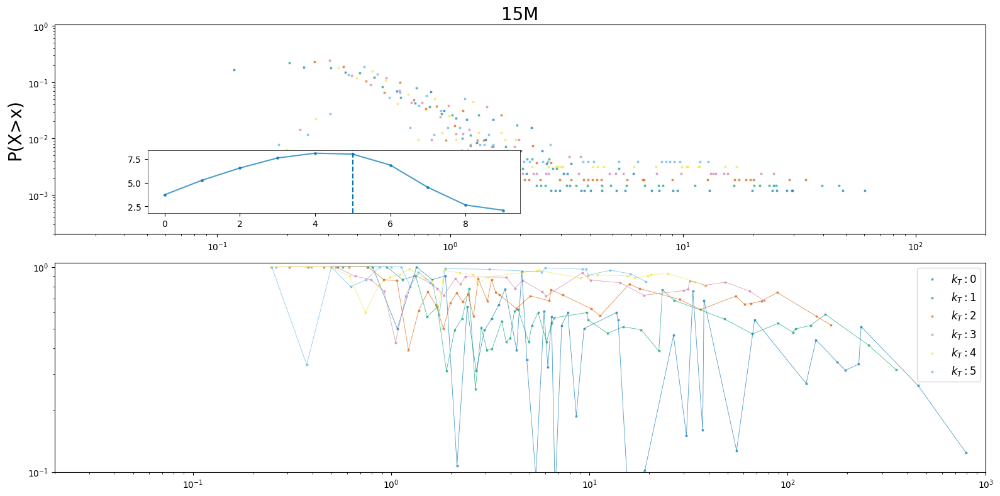

In [18]:
fig, axs = plt.subplots(2, 1)
fig.set_size_inches(16,8)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")

plot_pdf(axs[0], arr_deg_prob_15m, arr_kt_plot_15m, title="15M", ylabel="P(X>x)", ylim=(0.0002, 1.05), xlim=(0.02, 200))
ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
plot_avg_deg(ax0_inset, dict_hora_15m, limit_kt_15m, axvline=5)

plot_clust_ss(axs[1], arr_kt_plot_15m, dict_norm_int_deg_15m_h, xlim=(0.02, 1000))

plt.tight_layout()
plt.show()

## Uso de d-mercator

Los archivos de código relativos al uso de d-mercator se encuentran en la carpeta ```d-mercator/``` del presente repositorio.

## Grafos Filtrados

### Ajuste a ley de potencia de los grafos filtrados

In [ ]:
# Threshold empleado para cada manifestacion
umbral_15m = 5
umbral_9n = 5
umbral_ch = 3
umbral_wd = 2

umbral_otro_15m = 1
umbral_otro_9n = 3
umbral_otro_ch = 2
umbral_otro_wd = 3

In [ ]:
hour_window_15m, hour_window_9n, hour_window_ch, hour_window_wd

(1, 2, 2, 6)

In [ ]:
HORA_CRITICA_15m, HORA_CRITICA_9N, HORA_CRITICA_CH, HORA_CRITICA_WD

('429624', '437037', '394717', '422369')

In [ ]:
OTRA_HORA_15m = "429600"

'OTRA_HORA_WD = "422303'

In [ ]:
# CREACIÓN DE LOS GRAFOS FILTRADOS
write_filtered_graph("15m", HORA_CRITICA_15m, umbral_15m, graphs_folder, hour_window_15m)

Grafo nat:429624  (umbral 5) reducido a 13.08 % en nodos y  9.02 % en aristas.
Grafo 9n:437037  (umbral 5) reducido a 12.58 % en nodos y  7.1 % en aristas.
Grafo ch:394717  (umbral 3) reducido a 13.31 % en nodos y  7.4 % en aristas.


'write_filtered_graph("wd", HORA_CRITICA_WD, umbral_wd, hour_window_wd)'

In [ ]:
# CREACIÓN DE LOS GRAFOS FILTRADOS DE OTRAS HORAS NO CRITICAS

write_filtered_graph("15m", OTRA_HORA_15m, umbral_otro_15m, graphs_folder, hour_window_15m)

Grafo nat:429600  (umbral 1) reducido a 47.71 % en nodos y  79.71 % en aristas.
Grafo 9n:437000  (umbral 3) reducido a 9.13 % en nodos y  2.67 % en aristas.
Grafo ch:394628  (umbral 2) reducido a 25.64 % en nodos y  26.46 % en aristas.


'write_filtered_graph("wd", OTRA_HORA_WD, umbral_otro_wd, hour_window_wd)'

### Grado medio por kt

In [ ]:
# MAX_UMBRAL es el máximo K_T que se va a usar para generar subgrafos
MAX_UMBRAL = 200

dict_hora_15m_f = {}
G_15m = nx.read_gexf(graphs_folder + f"filtered/{umbral_15m}/15m/" + str(hour_window_15m) + '/' + HORA_CRITICA_15m + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_hora_15m_f.keys():
        # Se crea el subgrafo basandose en el threshold seleccionado
        F = thresh_normalization(G_15m,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_hora_15m_f[threshold] = calc_avg_degree(F)

dict_otra_hora_15m_f = {}
G_15m = nx.read_gexf(graphs_folder + f"filtered/{umbral_otro_15m}/15m/" + str(hour_window_15m) + '/' + OTRA_HORA_15m + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_otra_hora_15m_f.keys():
        # Se crea el subgrafo basandose en el threshold seleccionado
        F = thresh_normalization(G_15m,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_otra_hora_15m_f[threshold] = calc_avg_degree(F)


dict_hora_9n_f = {}
G_9n = nx.read_gexf(graphs_folder + f"filtered/{umbral_9n}/9n/" + str(hour_window_9n) + '/' + HORA_CRITICA_9N + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_hora_9n_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_9n,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_hora_9n_f[threshold] = calc_avg_degree(F)


dict_otra_hora_9n_f = {}
G_9n = nx.read_gexf(graphs_folder + f"filtered/{umbral_otro_9n}/9n/" + str(hour_window_9n) + '/' + OTRA_HORA_9N + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_otra_hora_9n_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_9n,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_otra_hora_9n_f[threshold] = calc_avg_degree(F)


dict_hora_ch_f = {}
G_ch = nx.read_gexf(graphs_folder + f"filtered/{umbral_ch}/ch/" + str(hour_window_ch) + '/' + HORA_CRITICA_CH + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_hora_ch_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_ch,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_hora_ch_f[threshold] = calc_avg_degree(F)


dict_otra_hora_ch_f = {}
G_ch = nx.read_gexf(graphs_folder + f"filtered/{umbral_otro_ch}/ch/" + str(hour_window_ch) + '/' + OTRA_HORA_CH + '.gexf')
arr_medium_deg = []
for threshold in tqdm(range(MAX_UMBRAL)):
    threshold = float(threshold)
    if not threshold in dict_otra_hora_ch_f.keys():
        # Se crea el subgrafo basándonos en el threshold seleccionado
        F = thresh_normalization(G_ch,  threshold)
        if F == -1:
            # Caso de grafo vacío o grafo inconexo
            break 
        dict_otra_hora_ch_f[threshold] = calc_avg_degree(F)



  0%|          | 0/200 [00:00<?, ?it/s]

 76%|███████▌  | 151/200 [00:00<00:00, 6222.76it/s]


In [ ]:
limit_kt_15m = 35
limit_kt_9n = 60
limit_kt_ch = 30
limit_kt_wd = 18

critical_kt_15m = 10
critical_kt_9n = 18
critical_kt_ch = 5
critical_kt_wd = 7

arr_kt_plot_15m = [0,4,6,8,10]
arr_kt_plot_9n = [0,6,9,12,15,18]
arr_kt_plot_ch = [0,1,2,3,4,5]
arr_kt_plot_wd = [0,1,2,3,4,5,6,7]


critical_otra_kt_15m = 10
critical_otra_kt_9n = 18
critical_otra_kt_ch = 5

arr_otra_kt_plot_15m = [0,3,6,9,12,15,18]
arr_otra_kt_plot_9n = [0,1,2,3,4,5]
arr_otra_kt_plot_ch =  [0,2,4,6,8,10]

In [ ]:
plfit_15m_f, arr_pdf_points_15m_f, arr_ccdf_points_15m_f = calc_degree_distribution(HORA_CRITICA_15m, "15m/" + str(hour_window_15m) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_15m, thresh_filt=umbral_15m, norm=True)
plfit_9n_f, arr_pdf_points_9n_f, arr_ccdf_points_9n_f = calc_degree_distribution(HORA_CRITICA_9N, "9n/" + str(hour_window_9n) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_9n, thresh_filt=umbral_9n, norm=True)
plfit_ch_f, arr_pdf_points_ch_f, arr_ccdf_points_ch_f = calc_degree_distribution(HORA_CRITICA_CH, "ch/" + str(hour_window_ch) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_ch, thresh_filt=umbral_ch, norm=True)
"""plfit_wd, arr_pdf_points_wd, arr_ccdf_points_wd = calc_degree_distribution(HORA_CRITICA_WD, "wd/" + str(hour_window_wd) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt_plot_wd, thresh_filt=umbral_wd, norm=True)"""

plfit_otra_15m_f, arr_pdf_points_otra_15m_f, arr_ccdf_points_otra_15m_f = calc_degree_distribution(OTRA_HORA_15m, "15m/" + str(hour_window_15m) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_15m, thresh_filt=umbral_otro_15m, norm=True)
plfit_otra_9n_f, arr_pdf_points_otra_9n_f, arr_ccdf_points_otra_9n_f = calc_degree_distribution(OTRA_HORA_9N, "9n/" + str(hour_window_9n) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_9n, thresh_filt=umbral_otro_9n, norm=True)
plfit_otra_ch_f, arr_pdf_points_otra_ch_f, arr_ccdf_points_otra_ch_f = calc_degree_distribution(OTRA_HORA_CH, "ch/" + str(hour_window_ch) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_ch, thresh_filt=umbral_otro_ch, norm=True)
"""plfit_otra_wd, arr_pdf_points_otra_wd, arr_ccdf_points_otra_wd = calc_degree_distribution(OTRA_HORA_WD, "wd/" + str(hour_window_wd) + '/', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_wd, thresh_filt=umbral_otro_wd, norm=True)"""

100%|██████████| 5/5 [00:00<00:00, 37923.18it/s]


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 24409.14it/s]


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 28308.01it/s]


Calculating best minimal value for power law fit


100%|██████████| 7/7 [00:00<00:00, 39356.74it/s]
Less than 2 unique data values left after xmin and xmax options! Cannot fit. Returning nans.


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 86184.33it/s]


Calculating best minimal value for power law fit


100%|██████████| 6/6 [00:00<00:00, 33779.63it/s]

Calculating best minimal value for power law fit


'plfit_otra_wd, arr_pdf_points_otra_wd, arr_ccdf_points_otra_wd = calc_degree_distribution(OTRA_HORA_WD, "wd/" + str(hour_window_wd) + \'/\', mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_otra_kt_plot_wd, thresh_filt=umbral_otro_wd, norm=True)'

### Autosimilitud de redes filtradas y Resultados en otras ventanas temporales diferentes a la crítica

In [ ]:
OTRA_HORA_15m, hour_window_15m

('429600', 1)

In [ ]:
# MAX_UMBRAL es el máximo K_T que vamos a usar para generar subgrafos
MAX_UMBRAL = 500
# Seleccionamos el fichero correspondiente a la manifestación social de la que queremos sacar la red y seleccionamos la hora que queremos estudiar
dict_thres_avg_clust_15m_h_f, dict_norm_int_deg_15m_h_f = calc_self_sim(HORA_CRITICA_15m, MAX_UMBRAL, "15m/" + str(hour_window_15m) + '/', mode="f", thresh_filter=umbral_15m)
dict_thres_avg_clust_9n_h_f, dict_norm_int_deg_9n_h_f = calc_self_sim(HORA_CRITICA_9N, MAX_UMBRAL, "9n/" + str(hour_window_9n) + '/', mode="f", thresh_filter=umbral_9n)
dict_thres_avg_clust_ch_h_f, dict_norm_int_deg_ch_h_f = calc_self_sim(HORA_CRITICA_CH, MAX_UMBRAL, "ch/" + str(hour_window_ch) + '/', mode="f", thresh_filter=umbral_ch)
"""dict_thres_avg_clust_wd_h, dict_norm_int_deg_wd_h = calc_self_sim(HORA_CRITICA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + '/', mode="f", thresh_filter=umbral_wd)"""


dict_thres_avg_clust_otra_15m_h_f, dict_norm_int_deg_otra_15m_h_f = calc_self_sim(OTRA_HORA_15m, MAX_UMBRAL, "15m/" + str(hour_window_15m) + '/', mode="f", thresh_filter=umbral_otro_15m)
dict_thres_avg_clust_otra_9n_h_f, dict_norm_int_deg_otra_9n_h_f = calc_self_sim(OTRA_HORA_9N, MAX_UMBRAL, "9n/" + str(hour_window_9n) + '/', mode="f", thresh_filter=umbral_otro_9n)
dict_thres_avg_clust_otra_ch_h_f, dict_norm_int_deg_otra_ch_h_f = calc_self_sim(OTRA_HORA_CH, MAX_UMBRAL, "ch/" + str(hour_window_ch) + '/', mode="f", thresh_filter=umbral_otro_ch)
"""dict_thres_avg_clust_otra_wd_h, dict_norm_int_deg_otra_wd_h = calc_self_sim(OTRA_HORA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + '/', mode="f", thresh_filter=umbral_otro_wd)"""

 30%|███       | 151/500 [00:00<00:00, 883.19it/s]


'dict_thres_avg_clust_otra_wd_h, dict_norm_int_deg_otra_wd_h = calc_self_sim(OTRA_HORA_WD, MAX_UMBRAL, "wd/" + str(hour_window_wd) + \'/\', mode="f", thresh_filter=umbral_otro_wd)'

In [ ]:
dict_thres_avg_clust_otra_15m_h_f

{0: np.float64(0.7791071718625731),
 1: np.float64(0.9020179456423345),
 2: np.float64(0.9089945464434691),
 3: np.float64(0.9280608388287804),
 4: np.float64(0.9293805566783919),
 5: np.float64(0.9204047910183468),
 6: np.float64(0.9397736763650499),
 7: np.float64(0.9064029866132409),
 8: np.float64(0.901486016791179),
 9: np.float64(0.8983422479230331),
 10: np.float64(0.8983384853282552),
 11: np.float64(0.9203479016239926),
 12: np.float64(0.9602116286706069),
 13: np.float64(0.9699197694103177),
 14: np.float64(0.9625847800550795),
 15: np.float64(0.9494551883799196),
 16: np.float64(0.959188525395422),
 17: np.float64(0.959188525395422),
 18: np.float64(0.959188525395422),
 19: np.float64(0.959188525395422),
 20: np.float64(0.959188525395422),
 21: np.float64(0.959188525395422),
 22: np.float64(0.959188525395422),
 23: np.float64(0.959188525395422),
 24: np.float64(0.966031746031746),
 25: np.float64(0.9),
 26: np.float64(0.8666666666666666),
 27: np.float64(0.8666666666666666),

In [ ]:
print("Alpha filtered 15m: ", get_exp_from_pdf(arr_pdf_points_15m_f))
print("Alpha filtered 9n: ", get_exp_from_pdf(arr_pdf_points_9n_f))
print("Alpha filteredc ch: ", get_exp_from_pdf(arr_pdf_points_ch_f))

Less than 2 unique data values left after xmin and xmax options! Cannot fit. Returning nans.
/home/msuarez/Escritorio/self_similarity/poster_cs3/github/self-similarity-in-social-movements/venv/lib/python3.12/site-packages/powerlaw.py:1151: RuntimeWarning: invalid value encountered in scalar divide
  self.alpha = 1 + (self.n / sum(log(data/self.xmin)))


Calculating best minimal value for power law fit
Alpha filtered NAT:  5.30797528951701
Calculating best minimal value for power law fit
Alpha filtered 9n:  nan
Calculating best minimal value for power law fit
Alpha filteredc ch:  1483.9997752304696


/home/msuarez/Escritorio/self_similarity/poster_cs3/github/self-similarity-in-social-movements/venv/lib/python3.12/site-packages/powerlaw.py:1170: RuntimeWarning: invalid value encountered in scalar divide
  return 1 + len(data)/sum(log(data / (self.xmin)))
Not enough data. Returning nan
Not enough data. Returning nan


In [ ]:
def configure_inset(inset):
    inset.set_facecolor('xkcd:white')
    for spine in inset.spines.values():
        spine.set_visible(True)  # Asegurar que sea visible
        spine.set_linewidth(0.5)   # Grosor del borde (opcional)
        spine.set_color("black") 
    inset.get_xaxis().set_visible(True)
    return inset
    

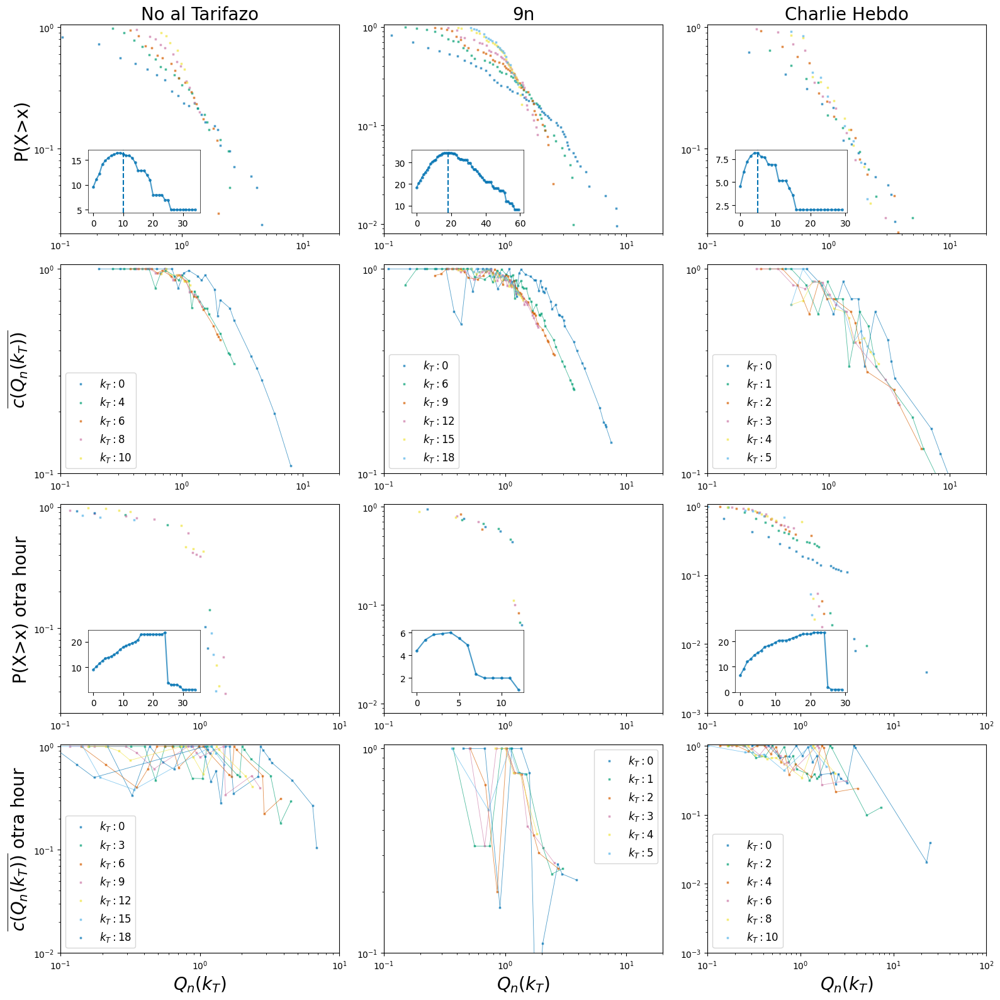

In [ ]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(4, 3)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,16)

xlim_15m = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_15m = (0.1, 10)
xlim_otra_9n = (0.1, 20)
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

for index, points in enumerate(arr_ccdf_points_15m_f):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_15m[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.02, 1.05)
axs[0].set_xlim(xlim_15m[0], xlim_15m[1])
axs[0].set_title("15M", fontsize=20)
axs[0].set_ylabel("P(X>x)", fontsize=20)


ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
ax0_inset.plot(list(dict_hora_15m_f.keys())[0:limit_kt_15m], list(dict_hora_15m_f.values())[0:limit_kt_15m], alpha=alpha)
ax0_inset.scatter(list(dict_hora_15m_f.keys())[0:limit_kt_15m], list(dict_hora_15m_f.values())[0:limit_kt_15m], s=6, alpha=alpha)
ax0_inset.axvline(critical_kt_15m, ls="--")

for index, points in enumerate(arr_ccdf_points_9n_f):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.008, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
ax1_inset.plot(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax1_inset.scatter(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
ax1_inset.axvline(critical_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_ch_f):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.02, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)
ax2_inset.plot(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax2_inset.scatter(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
ax2_inset.axvline(critical_kt_ch, ls="--")


for index, kt in enumerate(arr_kt_plot_15m[:]):
    if kt in dict_norm_int_deg_15m_h_f.keys():
        points_x = list(dict_norm_int_deg_15m_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_15m_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_15m_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[3].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[3].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[3].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[3].set_xscale('log')  
axs[3].set_yscale('log')      
axs[3].set_ylim(0.1, 1.05)
axs[3].set_xlim(xlim_15m[0], xlim_15m[1])
axs[3].legend(loc="lower left", prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_9n[0], xlim_9n[1])

axs[4].legend(loc="lower left", prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xscale('log')  
axs[5].set_yscale('log')          
axs[5].set_ylim(0.1, 1.05)
axs[5].set_xlim(xlim_ch[0], xlim_ch[1])
axs[5].legend(loc="lower left", prop={'size': 12})


for index, points in enumerate(arr_ccdf_points_otra_15m_f):
    axs[6].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_15m[index]))
axs[6].set_xscale('log')
axs[6].set_yscale('log')
axs[6].set_ylim(0.02, 1.05)
axs[6].set_xlim(xlim_otra_15m[0], xlim_otra_15m[1])
axs[6].set_ylabel("P(X>x) otra hour", fontsize=20)


ax6_inset = axs[6].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax6_inset)
ax6_inset.plot(list(dict_otra_hora_15m_f.keys())[0:limit_kt_15m], list(dict_otra_hora_15m_f.values())[0:limit_kt_15m], alpha=alpha)
ax6_inset.scatter(list(dict_otra_hora_15m_f.keys())[0:limit_kt_15m], list(dict_otra_hora_15m_f.values())[0:limit_kt_15m], s=6, alpha=alpha)
#ax6_inset.axvline(critical_otra_kt_15m, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_9n_f):
    axs[7].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_9n[index]))
axs[7].set_xscale('log')
axs[7].set_yscale('log')
axs[7].set_ylim(0.008, 1.05)
axs[7].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])
ax7_inset = axs[7].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax7_inset)
ax7_inset.plot(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax7_inset.scatter(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
#ax7_inset.axvline(critical_otra_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_ch_f):
    axs[8].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_ch[index]))
axs[8].set_xscale('log')
axs[8].set_yscale('log')
axs[8].set_ylim(0.001, 1.05)
axs[8].set_xlim(xlim_otra_ch[0], 100)
ax8_inset = axs[8].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax8_inset)
ax8_inset.plot(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax8_inset.scatter(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
#ax8_inset.axvline(critical_otra_kt_ch, ls="--")


for index, kt in enumerate(arr_otra_kt_plot_15m[:]):
    if kt in dict_norm_int_deg_otra_15m_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_15m_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_15m_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_15m_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[9].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[9].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[9].set_ylabel("$\\overline{c(Q_n(k_T))}$ otra hour ", fontsize=20)
axs[9].set_xlabel("$Q_n(k_T)$", fontsize=20)
axs[9].set_xscale('log')  
axs[9].set_yscale('log')      
axs[9].set_ylim(0.01, 1.05)
axs[9].set_xlim(xlim_otra_15m[0], xlim_otra_15m[1])
axs[9].legend(prop={'size': 12})


for index, kt in enumerate(arr_otra_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_otra_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[10].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[10].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[10].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[10].set_xscale('log')  
axs[10].set_yscale('log')      
axs[10].set_ylim(0.1, 1.05)
axs[10].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])

axs[10].legend(prop={'size': 12})


for index, kt in enumerate(arr_otra_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_otra_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[11].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[11].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[11].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[11].set_xscale('log')  
axs[11].set_yscale('log')          
axs[11].set_ylim(0.001, 1.05)
axs[11].set_xlim(xlim_otra_ch[0], 100)
axs[11].legend(prop={'size': 12})




plt.tight_layout()
plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

In [ ]:
len(arr_pdf_points_15m_f)

5

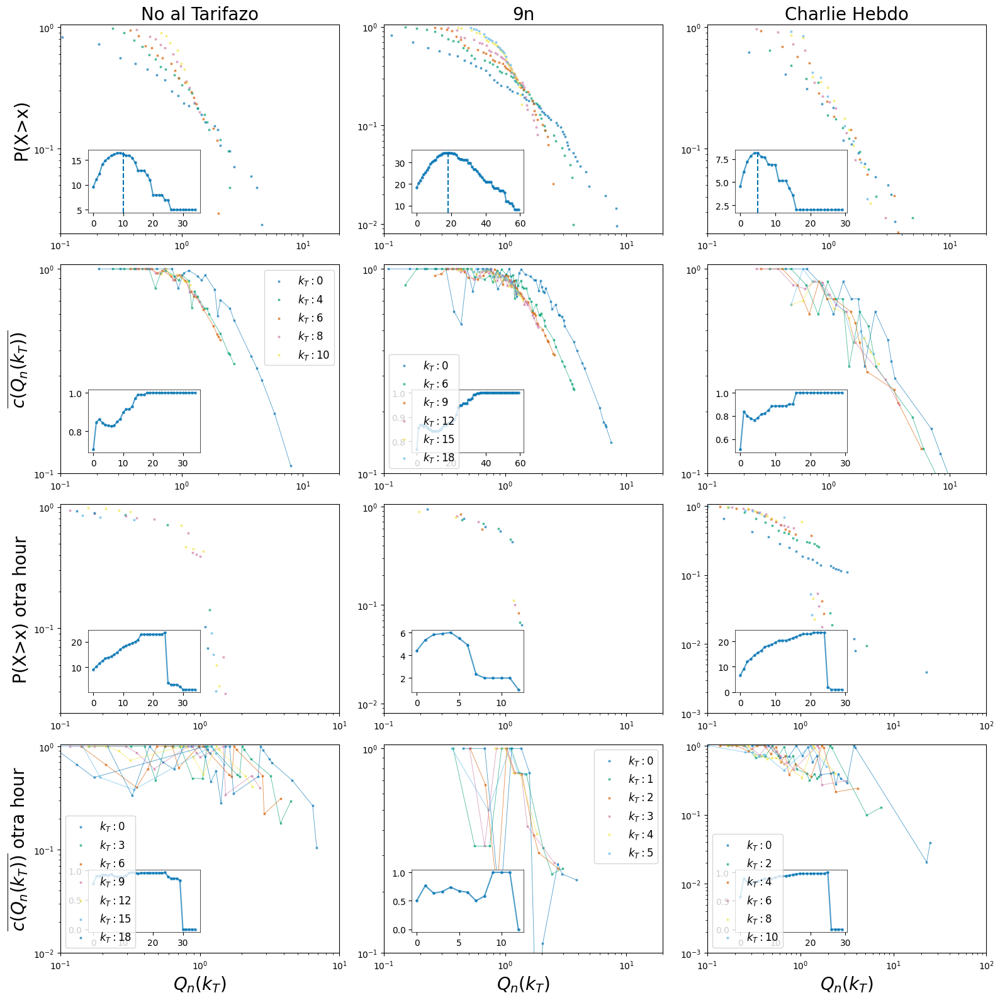

In [ ]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(4, 3)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,16)

xlim_15m = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_15m = (0.1, 10)
xlim_otra_9n = (0.1, 20)
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

for index, points in enumerate(arr_ccdf_points_15m_f):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_15m[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.02, 1.05)
axs[0].set_xlim(xlim_15m[0], xlim_15m[1])
axs[0].set_title("15M", fontsize=20)
axs[0].set_ylabel("P(X>x)", fontsize=20)


ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
ax0_inset.plot(list(dict_hora_15m_f.keys())[0:limit_kt_15m], list(dict_hora_15m_f.values())[0:limit_kt_15m], alpha=alpha)
ax0_inset.scatter(list(dict_hora_15m_f.keys())[0:limit_kt_15m], list(dict_hora_15m_f.values())[0:limit_kt_15m], s=6, alpha=alpha)
ax0_inset.axvline(critical_kt_15m, ls="--")

for index, points in enumerate(arr_ccdf_points_9n_f):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.008, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
ax1_inset.plot(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax1_inset.scatter(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
ax1_inset.axvline(critical_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_ch_f):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.02, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)
ax2_inset.plot(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax2_inset.scatter(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
ax2_inset.axvline(critical_kt_ch, ls="--")


for index, kt in enumerate(arr_kt_plot_15m[:]):
    if kt in dict_norm_int_deg_15m_h_f.keys():
        points_x = list(dict_norm_int_deg_15m_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_15m_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_15m_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[3].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[3].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[3].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[3].set_xscale('log')  
axs[3].set_yscale('log')      
axs[3].set_ylim(0.1, 1.05)
axs[3].set_xlim(xlim_15m[0], xlim_15m[1])

ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax3_inset)
ax3_inset.plot(list(dict_thres_avg_clust_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_15m_h_f.values())[0:limit_kt_15m], alpha=alpha)
ax3_inset.scatter(list(dict_thres_avg_clust_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_15m_h_f.values())[0:limit_kt_15m], s=6, alpha=alpha)

#axs[3].legend(loc="lower left", prop={'size': 12})
axs[3].legend(prop={'size': 12})


for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_9n[0], xlim_9n[1])

ax4_inset = axs[4].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax4_inset)
ax4_inset.plot(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
ax4_inset.scatter(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)

#axs[4].legend(loc="lower left", prop={'size': 12})
axs[4].legend(prop={'size': 12})




for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xscale('log')  
axs[5].set_yscale('log')          
axs[5].set_ylim(0.1, 1.05)
axs[5].set_xlim(xlim_ch[0], xlim_ch[1])

ax5_inset = axs[5].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax5_inset)
ax5_inset.plot(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
ax5_inset.scatter(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)

#axs[5].legend(loc="lower left", prop={'size': 12})
axs[4].legend(prop={'size': 12})


for index, points in enumerate(arr_ccdf_points_otra_15m_f):
    axs[6].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_15m[index]))
axs[6].set_xscale('log')
axs[6].set_yscale('log')
axs[6].set_ylim(0.02, 1.05)
axs[6].set_xlim(xlim_otra_15m[0], xlim_otra_15m[1])
axs[6].set_ylabel("P(X>x) otra hour", fontsize=20)


ax6_inset = axs[6].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax6_inset)
ax6_inset.plot(list(dict_otra_hora_15m_f.keys())[0:limit_kt_15m], list(dict_otra_hora_15m_f.values())[0:limit_kt_15m], alpha=alpha)
ax6_inset.scatter(list(dict_otra_hora_15m_f.keys())[0:limit_kt_15m], list(dict_otra_hora_15m_f.values())[0:limit_kt_15m], s=6, alpha=alpha)
#ax6_inset.axvline(critical_otra_kt_15m, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_9n_f):
    axs[7].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_9n[index]))
axs[7].set_xscale('log')
axs[7].set_yscale('log')
axs[7].set_ylim(0.008, 1.05)
axs[7].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])
ax7_inset = axs[7].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax7_inset)
ax7_inset.plot(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax7_inset.scatter(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
#ax7_inset.axvline(critical_otra_kt_9n, ls="--")

for index, points in enumerate(arr_ccdf_points_otra_ch_f):
    axs[8].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_ch[index]))
axs[8].set_xscale('log')
axs[8].set_yscale('log')
axs[8].set_ylim(0.001, 1.05)
axs[8].set_xlim(xlim_otra_ch[0], 100)
ax8_inset = axs[8].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax8_inset)
ax8_inset.plot(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax8_inset.scatter(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
#ax8_inset.axvline(critical_otra_kt_ch, ls="--")


for index, kt in enumerate(arr_otra_kt_plot_15m[:]):
    if kt in dict_norm_int_deg_otra_15m_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_15m_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_15m_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_15m_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[9].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[9].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[9].set_ylabel("$\\overline{c(Q_n(k_T))}$ otra hour ", fontsize=20)
axs[9].set_xlabel("$Q_n(k_T)$", fontsize=20)
axs[9].set_xscale('log')  
axs[9].set_yscale('log')      
axs[9].set_ylim(0.01, 1.05)
axs[9].set_xlim(xlim_otra_15m[0], xlim_otra_15m[1])
axs[9].legend(prop={'size': 12})

ax9_inset = axs[9].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax9_inset)
ax9_inset.plot(list(dict_thres_avg_clust_otra_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_otra_15m_h_f.values())[0:limit_kt_15m], alpha=alpha)
ax9_inset.scatter(list(dict_thres_avg_clust_otra_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_otra_15m_h_f.values())[0:limit_kt_15m], s=6, alpha=alpha)

#axs[9].legend(loc="lower left", prop={'size': 12})
axs[9].legend(prop={'size': 12})


for index, kt in enumerate(arr_otra_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_otra_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[10].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[10].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[10].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[10].set_xscale('log')  
axs[10].set_yscale('log')      
axs[10].set_ylim(0.1, 1.05)
axs[10].set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])


ax10_inset = axs[10].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax10_inset)
ax10_inset.plot(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
ax10_inset.scatter(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)

#axs[10].legend(loc="lower left", prop={'size': 12})
axs[10].legend(prop={'size': 12})



for index, kt in enumerate(arr_otra_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_otra_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[11].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[11].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[11].set_xlabel("$Q_n(k_T$)", fontsize=20)
axs[11].set_xscale('log')  
axs[11].set_yscale('log')          
axs[11].set_ylim(0.001, 1.05)
axs[11].set_xlim(xlim_otra_ch[0], 100)

ax11_inset = axs[11].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax11_inset)
ax11_inset.plot(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
ax11_inset.scatter(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)

#axs[11].legend(loc="lower left", prop={'size': 12})
axs[11].legend(prop={'size': 12})



plt.tight_layout()
#plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

### Figura 1: 2x2:
    CCDF en inset CCDF de otra hora
    SS en inset SS de otra hora

### Figura 2: 2x2
    AVg degree por kt
    Clust promedio por kt

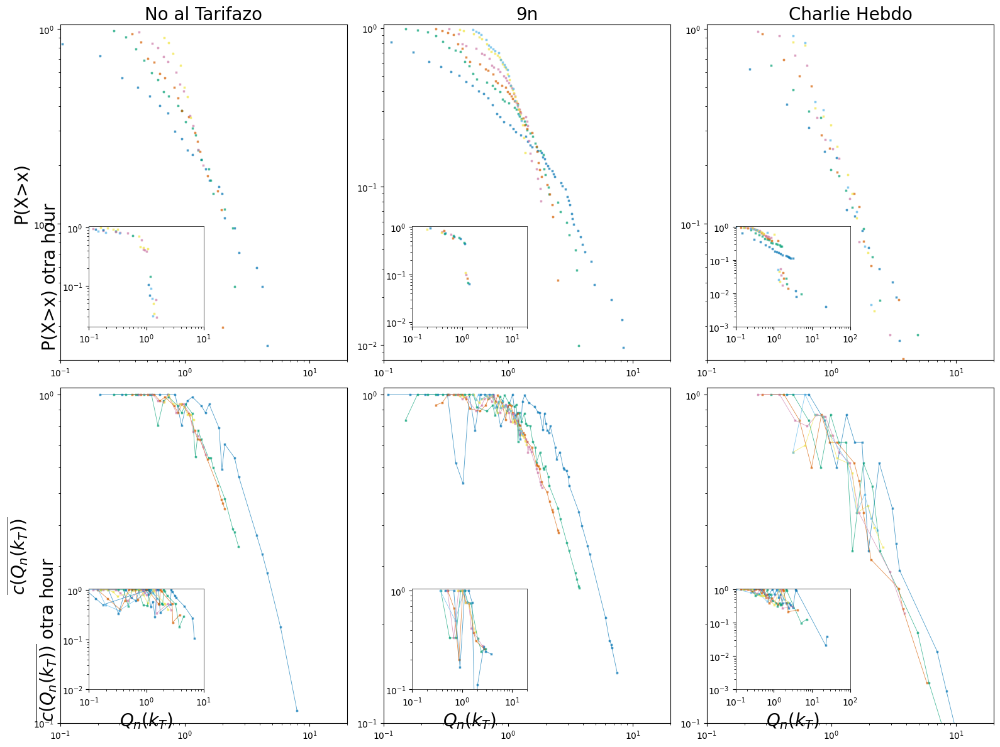

In [ ]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(2, 3)
axs = axs.flat 
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,12)

xlim_15m = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_15m = (0.1, 10)
xlim_otra_9n = (0.1, 20)
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

for index, points in enumerate(arr_ccdf_points_15m_f):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_T$ = " + str(arr_kt_plot_15m[index]))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_ylim(0.02, 1.05)
axs[0].set_xlim(xlim_15m[0], xlim_15m[1])
axs[0].set_title("15M", fontsize=20)
axs[0].set_ylabel("P(X>x)", fontsize=20)


ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
for index, points in enumerate(arr_ccdf_points_otra_15m_f):
    ax0_inset.scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_15m[index]))
ax0_inset.set_xscale('log')
ax0_inset.set_yscale('log')
ax0_inset.set_ylim(0.02, 1.05)
ax0_inset.set_xlim(xlim_otra_15m[0], xlim_otra_15m[1])
ax0_inset.set_ylabel("P(X>x) otra hour", fontsize=20)


for index, points in enumerate(arr_ccdf_points_9n_f):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_9n[index]))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_ylim(0.008, 1.05)
axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
for index, points in enumerate(arr_ccdf_points_otra_9n_f):
    ax1_inset.scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_9n[index]))
ax1_inset.set_xscale('log')
ax1_inset.set_yscale('log')
ax1_inset.set_ylim(0.008, 1.05)
ax1_inset.set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])


for index, points in enumerate(arr_ccdf_points_ch_f):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot_ch[index]))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_ylim(0.02, 1.05)
axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)

for index, points in enumerate(arr_ccdf_points_otra_ch_f):
    ax2_inset.scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_otra_kt_plot_ch[index]))
ax2_inset.set_xscale('log')
ax2_inset.set_yscale('log')
ax2_inset.set_ylim(0.001, 1.05)
ax2_inset.set_xlim(xlim_otra_ch[0], 100)




for index, kt in enumerate(arr_kt_plot_15m[:]):
    if kt in dict_norm_int_deg_15m_h_f.keys():
        points_x = list(dict_norm_int_deg_15m_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_15m_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_15m_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[3].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[3].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[3].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
axs[3].set_xscale('log')  
axs[3].set_yscale('log')      
axs[3].set_ylim(0.1, 1.05)
axs[3].set_xlim(xlim_15m[0], xlim_15m[1])

ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax3_inset)


for index, kt in enumerate(arr_otra_kt_plot_15m[:]):
    if kt in dict_norm_int_deg_otra_15m_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_15m_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_15m_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_15m_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        ax3_inset.plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        ax3_inset.scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

ax3_inset.set_ylabel("$\\overline{c(Q_n(k_T))}$ otra hour ", fontsize=20)
ax3_inset.set_xlabel("$Q_n(k_T)$", fontsize=20)
ax3_inset.set_xscale('log')  
ax3_inset.set_yscale('log')      
ax3_inset.set_ylim(0.01, 1.05)
ax3_inset.set_xlim(xlim_otra_15m[0], xlim_otra_15m[1])
#ax3_inset.legend(prop={'size': 12})



for index, kt in enumerate(arr_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[4].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[4].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[4].set_xscale('log')  
axs[4].set_yscale('log')      
axs[4].set_ylim(0.1, 1.05)
axs[4].set_xlim(xlim_9n[0], xlim_9n[1])

ax4_inset = axs[4].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax4_inset)

for index, kt in enumerate(arr_otra_kt_plot_9n[:]):
    if kt in dict_norm_int_deg_otra_9n_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_9n_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_9n_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_9n_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        ax4_inset.plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        ax4_inset.scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

ax4_inset.set_xlabel("$Q_n(k_T$)", fontsize=20)
ax4_inset.set_xscale('log')  
ax4_inset.set_yscale('log')      
ax4_inset.set_ylim(0.1, 1.05)
ax4_inset.set_xlim(xlim_otra_9n[0], xlim_otra_9n[1])
 





for index, kt in enumerate(arr_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        axs[5].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        axs[5].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

axs[5].set_xscale('log')  
axs[5].set_yscale('log')          
axs[5].set_ylim(0.1, 1.05)
axs[5].set_xlim(xlim_ch[0], xlim_ch[1])

ax5_inset = axs[5].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax5_inset)


for index, kt in enumerate(arr_otra_kt_plot_ch[:]):
    if kt in dict_norm_int_deg_otra_ch_h_f.keys():
        points_x = list(dict_norm_int_deg_otra_ch_h_f[kt].keys())[::]
        points_y = list(dict_norm_int_deg_otra_ch_h_f[kt].values())[::]
        # Se quita el 0 para que la visualizacións se más clara
        if float(0) in dict_norm_int_deg_otra_ch_h_f[kt].keys():
            points_x = points_x[1:]
            points_y = points_y[1:]

        points_y, indexes = calcular_quitar_ceros(points_y)
        points_x, _ = quitar_ceros(points_x, indexes)
 
        ax5_inset.plot(points_x, points_y, alpha=alpha, linewidth=0.6)
        ax5_inset.scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

ax5_inset.set_xlabel("$Q_n(k_T$)", fontsize=20)
ax5_inset.set_xscale('log')  
ax5_inset.set_yscale('log')          
ax5_inset.set_ylim(0.001, 1.05)
ax5_inset.set_xlim(xlim_otra_ch[0], 100)



plt.tight_layout()
#plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

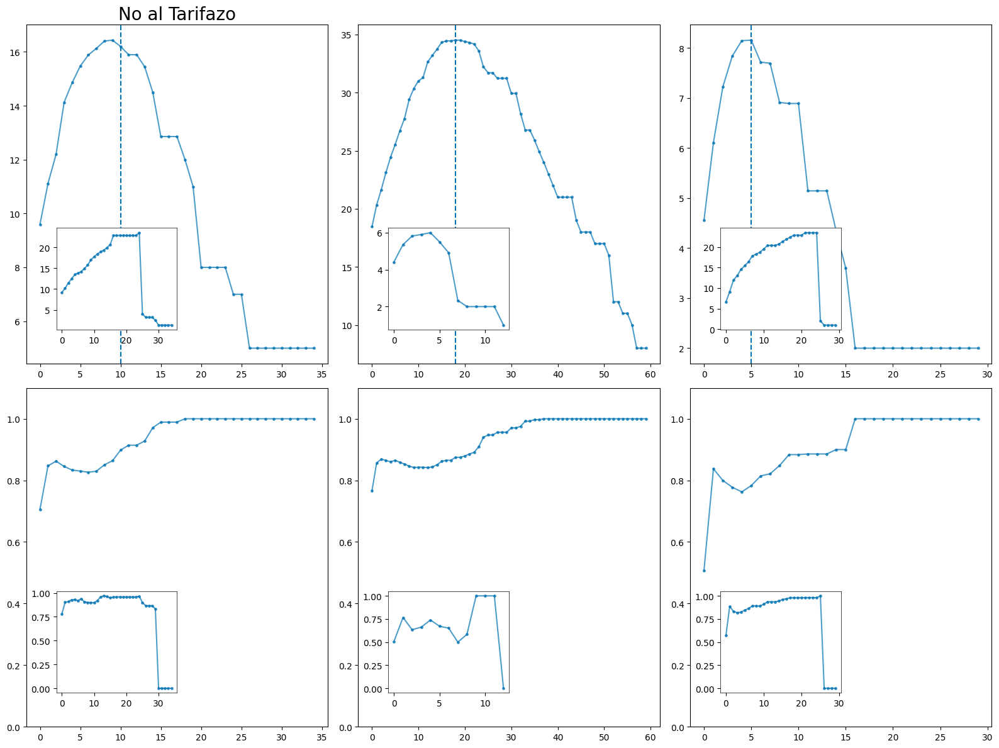

In [ ]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(2, 3)
axs = axs.flat 
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,12)

xlim_15m = (0.1, 20)
xlim_9n = (0.1, 20)
xlim_ch = (0.1, 20)
xlim_wd = (0.1, 20)

xlim_otra_15m = (0.1, 10)
xlim_otra_9n = (0.1, 20) 
xlim_otra_ch = (0.1, 20)
xlim_otra_wd = (0.1, 20)


dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []

axs[0].set_title("15M", fontsize=20)
axs[0].plot(list(dict_hora_15m_f.keys())[0:limit_kt_15m], list(dict_hora_15m_f.values())[0:limit_kt_15m], alpha=alpha)
axs[0].scatter(list(dict_hora_15m_f.keys())[0:limit_kt_15m], list(dict_hora_15m_f.values())[0:limit_kt_15m], s=6, alpha=alpha)
axs[0].axvline(critical_kt_15m, ls="--")
ax0_inset = axs[0].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax0_inset)
ax0_inset.plot(list(dict_otra_hora_15m_f.keys())[0:limit_kt_15m], list(dict_otra_hora_15m_f.values())[0:limit_kt_15m], alpha=alpha)
ax0_inset.scatter(list(dict_otra_hora_15m_f.keys())[0:limit_kt_15m], list(dict_otra_hora_15m_f.values())[0:limit_kt_15m], s=6, alpha=alpha)



axs[1].plot(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
axs[1].scatter(list(dict_hora_9n_f.keys())[0:limit_kt_9n], list(dict_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
axs[1].axvline(critical_kt_9n, ls="--")
ax1_inset = axs[1].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax1_inset)
ax1_inset.plot(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], alpha=alpha)
ax1_inset.scatter(list(dict_otra_hora_9n_f.keys())[0:limit_kt_9n], list(dict_otra_hora_9n_f.values())[0:limit_kt_9n], s=6, alpha=alpha)


axs[2].plot(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
axs[2].scatter(list(dict_hora_ch_f.keys())[0:limit_kt_ch], list(dict_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
axs[2].axvline(critical_kt_ch, ls="--")
ax2_inset = axs[2].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax2_inset)
ax2_inset.plot(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], alpha=alpha)
ax2_inset.scatter(list(dict_otra_hora_ch_f.keys())[0:limit_kt_ch], list(dict_otra_hora_ch_f.values())[0:limit_kt_ch], s=6, alpha=alpha)

axs[3].plot(list(dict_thres_avg_clust_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_15m_h_f.values())[0:limit_kt_15m], alpha=alpha)
axs[3].scatter(list(dict_thres_avg_clust_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_15m_h_f.values())[0:limit_kt_15m], s=6, alpha=alpha)
axs[3].set_ylim(0,1.1)
ax3_inset = axs[3].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax3_inset)
ax3_inset.plot(list(dict_thres_avg_clust_otra_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_otra_15m_h_f.values())[0:limit_kt_15m], alpha=alpha)
ax3_inset.scatter(list(dict_thres_avg_clust_otra_15m_h_f.keys())[0:limit_kt_15m], list(dict_thres_avg_clust_otra_15m_h_f.values())[0:limit_kt_15m], s=6, alpha=alpha)


axs[4].plot(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
axs[4].scatter(list(dict_thres_avg_clust_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)
axs[4].set_ylim(0,1.1)
ax4_inset = axs[4].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax4_inset)
ax4_inset.plot(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], alpha=alpha)
ax4_inset.scatter(list(dict_thres_avg_clust_otra_9n_h_f.keys())[0:limit_kt_9n], list(dict_thres_avg_clust_otra_9n_h_f.values())[0:limit_kt_9n], s=6, alpha=alpha)

axs[5].plot(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
axs[5].scatter(list(dict_thres_avg_clust_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)
axs[5].set_ylim(0,1.1)
ax5_inset = axs[5].inset_axes([0.1, 0.1, 0.4, 0.3])
configure_inset(ax5_inset)
ax5_inset.plot(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], alpha=alpha)
ax5_inset.scatter(list(dict_thres_avg_clust_otra_ch_h_f.keys())[0:limit_kt_ch], list(dict_thres_avg_clust_otra_ch_h_f.values())[0:limit_kt_ch], s=6, alpha=alpha)






plt.tight_layout()
#plt.savefig(plots_folder + "CCDF_degree_self_sim_paper_filtered.png")
plt.show()

#  Gráfica CCDFs pre y post filtrado

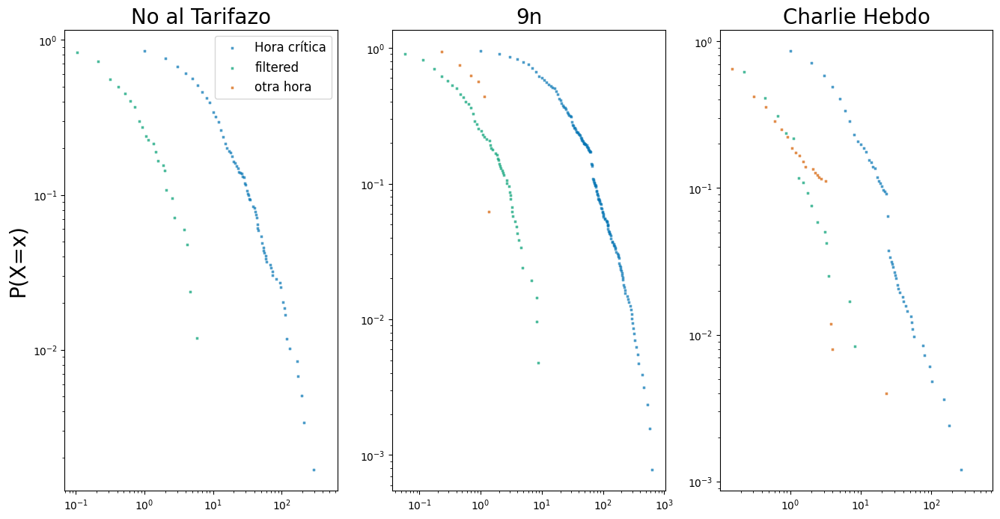

In [ ]:
plt.style.use('seaborn-v0_8-colorblind')    

fig, axs = plt.subplots(1, 3)
axs = axs.flat
for ax in axs:  
    ax.set_facecolor("white")
fig.set_size_inches(16,8)



dot_size=4
marker = "" \
"x"
alpha=0.7

array_puntos_plfit = []
axs[0].set_title("15M", fontsize=20)
for index, points in enumerate(arr_ccdf_points_15m[:1]):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="Hora crítica")
axs[0].set_xscale('log')
axs[0].set_yscale('log')
#axs[0].set_ylim(0.0002, 1.05)
#axs[0].set_xlim(xlim_15m[0], xlim_15m[1])
axs[0].set_ylabel("P(X=x)", fontsize=20)

for index, points in enumerate(arr_ccdf_points_9n[:1]):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="Hora crítica")
axs[1].set_xscale('log')
axs[1].set_yscale('log')
#axs[1].set_ylim(0.0002, 1.05)
#axs[1].set_xlim(xlim_9n[0], xlim_9n[1])
axs[1].set_title("9n", fontsize=20)

for index, points in enumerate(arr_ccdf_points_ch[:1]):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="Hora crítica")
axs[2].set_xscale('log')
axs[2].set_yscale('log')
#axs[2].set_ylim(0.0002, 1.05)
#axs[2].set_xlim(xlim_ch[0], xlim_ch[1])
axs[2].set_title("Charlie Hebdo", fontsize=20)

for index, points in enumerate(arr_ccdf_points_15m_f[:1]):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_9n_f[:1]):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_ch_f[:1]):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_otra_15m_f[:1]):
    axs[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="otra hora")

for index, points in enumerate(arr_ccdf_points_otra_9n_f[:1]):
    axs[1].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

for index, points in enumerate(arr_ccdf_points_otra_ch_f[:1]):
    axs[2].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="filtered")

axs[0].legend(prop={'size': 12})
plt.show()


In [ ]:
arr_pdf_points_otra_ch_f[0]

(array([ 0.1507177 ,  0.30143541,  0.45215311,  0.60287081,  0.75358852,
         0.90430622,  1.05502392,  1.20574163,  1.35645933,  1.50717703,
         1.65789474,  2.11004785,  2.26076555,  2.41148325,  2.56220096,
         2.71291866,  3.16507177,  3.76794258,  3.91866029, 22.75837321,
        24.86842105]),
 array([0.34920635, 0.23015873, 0.06349206, 0.07142857, 0.03571429,
        0.02777778, 0.03571429, 0.01190476, 0.00793651, 0.01587302,
        0.01190476, 0.00396825, 0.00793651, 0.00396825, 0.00396825,
        0.00396825, 0.00396825, 0.09920635, 0.00396825, 0.00396825,
        0.00396825]))

# Grafica SS y CCDF (+ avg clust y avg deg in inset) muchas horas

In [ ]:
def horas_filtradas(horas_mov, manifestacion, hour_window, graphs_folder, filtered=False, umbral=None):
    horas_filt = []
    for hora in horas_mov:
        if filtered:
            write_filtered_graph(manifestacion, hora, umbral, graphs_folder, hour_window)

            G = nx.read_gexf(graphs_folder + f"filtered/{umbral}/{manifestacion}/{hour_window}/{hora}.gexf")
        else:
            # Si no se filtran los nodos, se leen los archivos sin el sufijo 'filtered'
            G = nx.read_gexf(graphs_folder + f"nodes_hashtag/{manifestacion}/{hour_window}/{hora}.gexf")
        if len(G.nodes) > 50:
            horas_filt.append(hora)
    return horas_filt

In [ ]:
def proc_data_ccdf(hora, manifestacion, hour_window, graphs_folder, measures_folder, arr_kt=None, umbral=None, norm=False):
    plfit, arr_pdf_points, arr_ccdf_points= calc_degree_distribution(hora, f"{manifestacion}/{hour_window}/", mode="f", graphs_folder=graphs_folder, measures_folder=measures_folder, exp=True, arr_kt=arr_kt, thresh_filt=umbral, norm=True)
    return plfit, arr_pdf_points, arr_ccdf_points

In [ ]:
def calc_avg_deg_kt(graphs_folder, hora, manifestacion, hour_window, umbral):
    dict_hora = {}
    G_15m = nx.read_gexf(graphs_folder + f"filtered/{umbral}/{manifestacion}/{hour_window}/{hora}.gexf")
    for threshold in tqdm(range(MAX_UMBRAL)):
        threshold = float(threshold)
        if not threshold in dict_hora.keys():
            # Se crea el subgrafo basandose en el threshold seleccionado
            F = thresh_normalization(G_15m,  threshold)
            if F == -1:
                # Caso de grafo vacío o grafo inconexo
                break 
            dict_hora[threshold] = calc_avg_degree(F)
    return dict_hora

In [ ]:
def plot(hora, manifestacion, hour_window, arr_kt_plot, umbral, axs_row):
    write_filtered_graph(manifestacion, hora, umbral, graphs_folder, hour_window)

    _, _, arr_ccdf_points = proc_data_ccdf(hora, manifestacion, hour_window, graphs_folder, measures_folder, arr_kt=arr_kt_plot, umbral=umbral, norm=True)
    dict_hora = calc_avg_deg_kt(graphs_folder, hora, manifestacion, hour_window, umbral)
    dict_thres_avg_clust, dict_norm_int_deg = calc_self_sim(hora, MAX_UMBRAL, f"{manifestacion}/{hour_window}/")
    limit_kt = 40

    """plt.style.use('seaborn-v0_8-colorblind')    

    fig, axs = plt.subplots(1, 2)
    axs = axs.flat
    for ax in axs:  
        ax.set_facecolor("white")
    fig.set_size_inches(8,4)
"""
    for index, points in enumerate(arr_ccdf_points):
        axs_row[0].scatter(points[0], points[1], marker=marker, s=dot_size, alpha=alpha, label="$k_t : $" + str(arr_kt_plot[index]))
    axs_row[0].set_xscale('log')
    axs_row[0].set_yscale('log')
    axs_row[0].set_ylim(0.02, 1.05)
    #axs[0].set_xlim(xlim_15m[0], xlim_15m[1])
    axs_row[0].set_title(f"{manifestacion}-{hora}", fontsize=20)
    axs_row[0].set_ylabel("P(X>x)", fontsize=20)


    ax0_inset = axs_row[0].inset_axes([0.1, 0.1, 0.4, 0.3])
    configure_inset(ax0_inset)
    ax0_inset.plot(list(dict_hora.keys())[0:limit_kt], list(dict_hora.values())[0:limit_kt], alpha=alpha)
    ax0_inset.scatter(list(dict_hora.keys())[0:limit_kt], list(dict_hora.values())[0:limit_kt], s=6, alpha=alpha)
    #ax0_inset.axvline(critical_kt_15m, ls="--")


    for index, kt in enumerate(arr_kt_plot[:]):
        if kt in dict_norm_int_deg.keys():
            points_x = list(dict_norm_int_deg[kt].keys())[::]
            points_y = list(dict_norm_int_deg[kt].values())[::]
            # Se quita el 0 para que la visualizacións se más clara
            if float(0) in dict_norm_int_deg[kt].keys():
                points_x = points_x[1:]
                points_y = points_y[1:]

            points_y, indexes = calcular_quitar_ceros(points_y)
            points_x, _ = quitar_ceros(points_x, indexes)
    
            axs_row[1].plot(points_x, points_y, alpha=alpha, linewidth=0.6)
            axs_row[1].scatter(points_x, points_y, alpha=alpha, s=4, marker=marker, label=f'$k_T: {kt}$')        

    axs_row[1].set_ylabel("$\\overline{c(Q_n(k_T))}$", fontsize=20)
    axs_row[1].set_xscale('log')  
    axs_row[1].set_yscale('log')      
    axs_row[1].set_ylim(0.1, 1.05)
    #axs[1].set_xlim(xlim_15m[0], xlim_15m[1])

    ax3_inset = axs_row[1].inset_axes([0.1, 0.1, 0.4, 0.3])
    configure_inset(ax3_inset)
    ax3_inset.plot(list(dict_thres_avg_clust.keys())[0:limit_kt], list(dict_thres_avg_clust.values())[0:limit_kt], alpha=alpha)
    ax3_inset.scatter(list(dict_thres_avg_clust.keys())[0:limit_kt], list(dict_thres_avg_clust.values())[0:limit_kt], s=6, alpha=alpha)

    #axs[3].legend(loc="lower left", prop={'size': 12})
    axs_row[1].legend(prop={'size': 12})

    #plt.show()

In [ ]:
horas_15m = list(hour_15m)
horas_9n = list(hour_9n)
horas_ch = list(hour_ch)

horas_filtr_15m = horas_filtradas(horas_15m, "15m", hour_window_15m, graphs_folder, filtered=True, umbral=3)
horas_filtr_9n = horas_filtradas(horas_9n, "9n", hour_window_9n, graphs_folder, filtered=True, umbral=umbral_9n)
horas_filtr_ch = horas_filtradas(horas_ch, "ch", hour_window_ch, graphs_folder , filtered=True, umbral=umbral_ch)

print(f"15m: {len(horas_15m)}-->{len(horas_filtr_15m)}; 9n:{len(horas_9n)}-->{len(horas_filtr_9n)}; CH:{len(horas_ch)}-->{len(horas_filtr_ch)}")

Grafo nat:429531  (umbral 3) reducido a 3.61 % en nodos y  1.9 % en aristas.
Grafo nat:429532  (umbral 3) reducido a 1.98 % en nodos y  1.82 % en aristas.
Grafo nat:429533  (umbral 3) reducido a 2.81 % en nodos y  1.63 % en aristas.
Grafo nat:429534  (umbral 3) reducido a 0.89 % en nodos y  0.0 % en aristas.
Grafo nat:429535  (umbral 3) reducido a 1.41 % en nodos y  0.0 % en aristas.
Grafo nat:429536  (umbral 3) reducido a 2.17 % en nodos y  0.0 % en aristas.
Grafo nat:429537  (umbral 3) reducido a 2.7 % en nodos y  0.0 % en aristas.
Grafo nat:429538  (umbral 3) reducido a 1.89 % en nodos y  0.0 % en aristas.
Grafo nat:429539  (umbral 3) reducido a 2.08 % en nodos y  0.52 % en aristas.
Grafo nat:429540  (umbral 3) reducido a 0.61 % en nodos y  0.0 % en aristas.
Grafo nat:429541  (umbral 3) reducido a 1.78 % en nodos y  1.33 % en aristas.
Grafo nat:429542  (umbral 3) reducido a 2.7 % en nodos y  0.95 % en aristas.
Grafo nat:429543  (umbral 3) reducido a 3.18 % en nodos y  2.72 % en aris

## 15m
La hora crítica 15m es: 429624

In [ ]:
hour_window_15m, arr_kt_plot_15m, umbral_15m

(1, [0, 4, 6, 8, 10], 5)

  0%|          | 0/4 [00:00<?, ?it/s]

Grafo nat:429623  (umbral 5) reducido a 10.36 % en nodos y  10.45 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 31394.49it/s]


Calculating best minimal value for power law fit


 25%|██▌       | 1/4 [00:02<00:08,  2.87s/it]

Grafo nat:429624  (umbral 5) reducido a 13.08 % en nodos y  9.02 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 13400.33it/s]


Calculating best minimal value for power law fit


 50%|█████     | 2/4 [00:05<00:06,  3.01s/it]

Grafo nat:429625  (umbral 5) reducido a 11.09 % en nodos y  7.72 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 19382.18it/s]


Calculating best minimal value for power law fit


 75%|███████▌  | 3/4 [00:08<00:02,  2.79s/it]

Grafo nat:429626  (umbral 5) reducido a 7.23 % en nodos y  4.32 % en aristas.


100%|██████████| 5/5 [00:00<00:00, 36986.81it/s]


Calculating best minimal value for power law fit


100%|██████████| 4/4 [00:10<00:00,  2.53s/it]


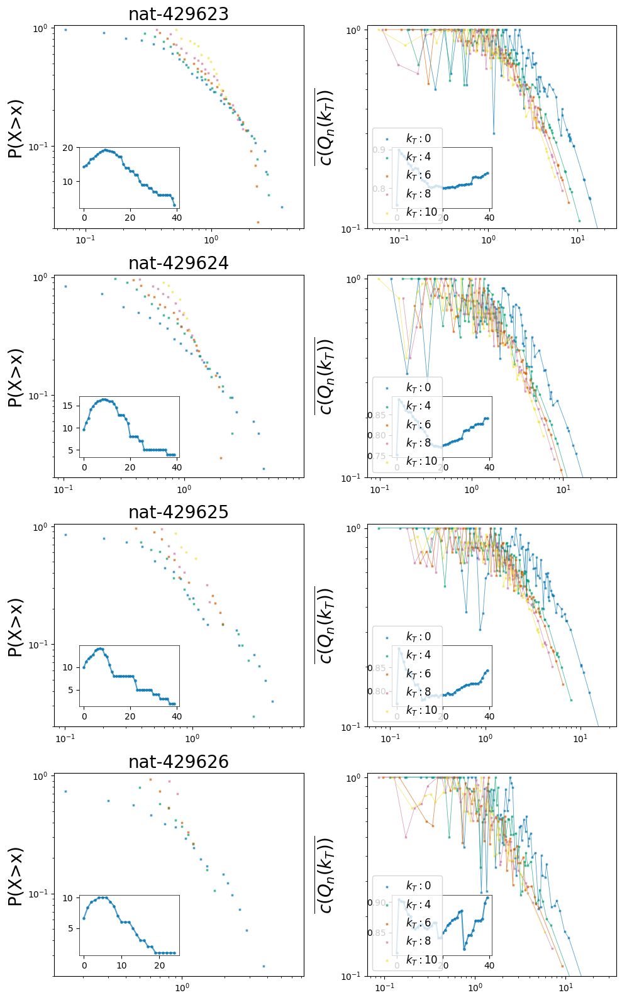

In [ ]:
num_horas = len(horas_filtr_15m)
plt.style.use('seaborn-v0_8-colorblind')
fig, axs = plt.subplots(num_horas, 2, figsize=(10, 4 * num_horas))

for idx, hora in enumerate(tqdm(horas_filtr_15m)):
    plot(str(hora), "15m", hour_window_15m, arr_kt_plot_15m, umbral_15m, axs[idx])
for ax_pair in axs:
    ax_pair[1].legend(prop={'size': 12})
plt.tight_layout()
plt.show()

## 9n
La hora crítica 9N es: 437037

In [ ]:
hour_window_9n, arr_kt_plot_9n, umbral_9n

(2, [0, 6, 9, 12, 15, 18], 5)

  0%|          | 0/32 [00:00<?, ?it/s]

Grafo 9n:436989  (umbral 5) reducido a 5.42 % en nodos y  2.18 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35544.95it/s]


Calculating best minimal value for power law fit


  3%|▎         | 1/32 [00:04<02:27,  4.75s/it]

Grafo 9n:436991  (umbral 5) reducido a 4.95 % en nodos y  2.2 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 31775.03it/s]


Calculating best minimal value for power law fit


  6%|▋         | 2/32 [00:10<02:40,  5.37s/it]

Grafo 9n:436993  (umbral 5) reducido a 9.26 % en nodos y  3.27 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23718.97it/s]


Calculating best minimal value for power law fit


  9%|▉         | 3/32 [00:25<04:37,  9.56s/it]

Grafo 9n:436995  (umbral 5) reducido a 8.7 % en nodos y  3.03 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 10123.02it/s]


Calculating best minimal value for power law fit


 12%|█▎        | 4/32 [00:28<03:23,  7.25s/it]

Grafo 9n:437003  (umbral 5) reducido a 5.83 % en nodos y  1.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 9161.20it/s]


Calculating best minimal value for power law fit


 16%|█▌        | 5/32 [00:34<02:57,  6.57s/it]

Grafo 9n:437009  (umbral 5) reducido a 5.27 % en nodos y  2.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28597.53it/s]


Calculating best minimal value for power law fit


 19%|█▉        | 6/32 [00:37<02:24,  5.54s/it]

Grafo 9n:437011  (umbral 5) reducido a 7.22 % en nodos y  2.81 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35595.22it/s]


Calculating best minimal value for power law fit


 22%|██▏       | 7/32 [00:44<02:29,  5.97s/it]

Grafo 9n:437013  (umbral 5) reducido a 7.73 % en nodos y  3.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 40655.61it/s]


Calculating best minimal value for power law fit


 25%|██▌       | 8/32 [00:53<02:45,  6.89s/it]

Grafo 9n:437015  (umbral 5) reducido a 10.62 % en nodos y  4.62 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 39260.26it/s]


Calculating best minimal value for power law fit


 28%|██▊       | 9/32 [01:07<03:32,  9.24s/it]

Grafo 9n:437017  (umbral 5) reducido a 9.42 % en nodos y  4.3 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28212.81it/s]


Calculating best minimal value for power law fit


 31%|███▏      | 10/32 [01:22<03:59, 10.90s/it]

Grafo 9n:437019  (umbral 5) reducido a 8.96 % en nodos y  2.78 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 24036.13it/s]


Calculating best minimal value for power law fit


 34%|███▍      | 11/32 [01:31<03:35, 10.26s/it]

Grafo 9n:437027  (umbral 5) reducido a 5.84 % en nodos y  1.09 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32017.59it/s]


Calculating best minimal value for power law fit


 38%|███▊      | 12/32 [02:56<10:59, 32.95s/it]

Grafo 9n:437029  (umbral 5) reducido a 6.21 % en nodos y  1.92 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25266.89it/s]


Calculating best minimal value for power law fit


 41%|████      | 13/32 [03:11<08:47, 27.76s/it]

Grafo 9n:437031  (umbral 5) reducido a 8.49 % en nodos y  3.46 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 34663.67it/s]


Calculating best minimal value for power law fit


 44%|████▍     | 14/32 [03:24<06:56, 23.15s/it]

Grafo 9n:437033  (umbral 5) reducido a 6.83 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32682.89it/s]


Calculating best minimal value for power law fit


 47%|████▋     | 15/32 [04:02<07:47, 27.52s/it]

Grafo 9n:437035  (umbral 5) reducido a 10.72 % en nodos y  6.13 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25575.02it/s]


Calculating best minimal value for power law fit


 50%|█████     | 16/32 [04:16<06:18, 23.64s/it]

Grafo 9n:437037  (umbral 5) reducido a 12.58 % en nodos y  7.1 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 34711.48it/s]


Calculating best minimal value for power law fit


 53%|█████▎    | 17/32 [04:58<07:18, 29.21s/it]

Grafo 9n:437039  (umbral 5) reducido a 12.23 % en nodos y  7.52 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23674.34it/s]


Calculating best minimal value for power law fit


 56%|█████▋    | 18/32 [05:33<07:12, 30.93s/it]

Grafo 9n:437041  (umbral 5) reducido a 13.77 % en nodos y  5.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 16163.02it/s]


Calculating best minimal value for power law fit


 59%|█████▉    | 19/32 [06:04<06:42, 31.00s/it]

Grafo 9n:437043  (umbral 5) reducido a 12.96 % en nodos y  5.08 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 26973.02it/s]


Calculating best minimal value for power law fit


 62%|██████▎   | 20/32 [06:22<05:22, 26.87s/it]

Grafo 9n:437045  (umbral 5) reducido a 11.05 % en nodos y  2.95 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23323.28it/s]


Calculating best minimal value for power law fit


 66%|██████▌   | 21/32 [06:30<03:55, 21.37s/it]

Grafo 9n:437051  (umbral 5) reducido a 9.88 % en nodos y  3.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38597.89it/s]


Calculating best minimal value for power law fit


 69%|██████▉   | 22/32 [06:42<03:04, 18.41s/it]

Grafo 9n:437053  (umbral 5) reducido a 8.33 % en nodos y  2.77 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 31936.32it/s]


Calculating best minimal value for power law fit


 72%|███████▏  | 23/32 [06:52<02:23, 15.92s/it]

Grafo 9n:437055  (umbral 5) reducido a 5.85 % en nodos y  2.65 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 37063.07it/s]


Calculating best minimal value for power law fit


 75%|███████▌  | 24/32 [07:00<01:48, 13.57s/it]

Grafo 9n:437057  (umbral 5) reducido a 6.78 % en nodos y  3.72 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 17142.93it/s]


Calculating best minimal value for power law fit


 78%|███████▊  | 25/32 [07:06<01:18, 11.28s/it]

Grafo 9n:437059  (umbral 5) reducido a 9.97 % en nodos y  4.21 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18355.82it/s]


Calculating best minimal value for power law fit


 81%|████████▏ | 26/32 [07:30<01:31, 15.22s/it]

Grafo 9n:437061  (umbral 5) reducido a 10.95 % en nodos y  5.36 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23944.65it/s]


Calculating best minimal value for power law fit


 84%|████████▍ | 27/32 [08:09<01:51, 22.35s/it]

Grafo 9n:437063  (umbral 5) reducido a 10.63 % en nodos y  5.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27807.54it/s]


Calculating best minimal value for power law fit


 88%|████████▊ | 28/32 [08:35<01:32, 23.25s/it]

Grafo 9n:437065  (umbral 5) reducido a 10.09 % en nodos y  2.55 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35797.76it/s]


Calculating best minimal value for power law fit


 91%|█████████ | 29/32 [10:09<02:14, 44.73s/it]

Grafo 9n:437067  (umbral 5) reducido a 10.37 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25394.37it/s]


Calculating best minimal value for power law fit


 94%|█████████▍| 30/32 [10:52<01:28, 44.18s/it]

Grafo 9n:437075  (umbral 5) reducido a 5.66 % en nodos y  0.96 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32939.56it/s]


Calculating best minimal value for power law fit


 97%|█████████▋| 31/32 [12:15<00:55, 55.61s/it]

Grafo 9n:437077  (umbral 5) reducido a 7.75 % en nodos y  3.59 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38130.04it/s]


Calculating best minimal value for power law fit


100%|██████████| 32/32 [12:21<00:00, 23.16s/it]


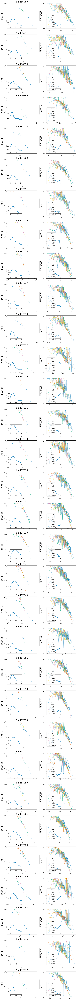

  0%|          | 0/32 [00:00<?, ?it/s]


TypeError: plot() missing 1 required positional argument: 'axs_row'

In [ ]:
num_horas = len(horas_filtr_9n)
plt.style.use('seaborn-v0_8-colorblind')
fig, axs = plt.subplots(num_horas, 2, figsize=(10, 4 * num_horas))

for idx, hora in enumerate(tqdm(horas_filtr_9n)):
    plot(str(hora), "9n", hour_window_9n, arr_kt_plot_9n, umbral_9n, axs[idx])
for ax_pair in axs:
    ax_pair[1].legend(prop={'size': 12})
plt.tight_layout()
plt.show()

for hora in tqdm(horas_filtr_9n):
    plot(str(hora), "9n", hour_window_9n, arr_kt_plot_9n, umbral_9n)

  0%|          | 0/32 [00:00<?, ?it/s]

Grafo 9n:436989  (umbral 5) reducido a 5.42 % en nodos y  2.18 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23301.69it/s]


Calculating best minimal value for power law fit


 36%|███▌      | 180/500 [00:04<00:07, 44.34it/s]


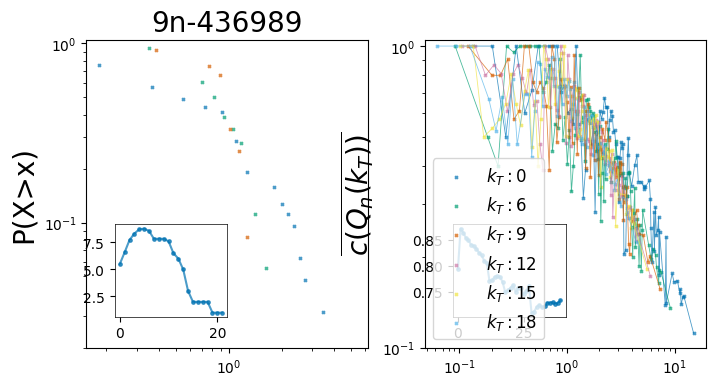

  3%|▎         | 1/32 [00:05<02:35,  5.02s/it]

Grafo 9n:436991  (umbral 5) reducido a 4.95 % en nodos y  2.2 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 35848.75it/s]


Calculating best minimal value for power law fit


 42%|████▏     | 211/500 [00:05<00:07, 38.68it/s]


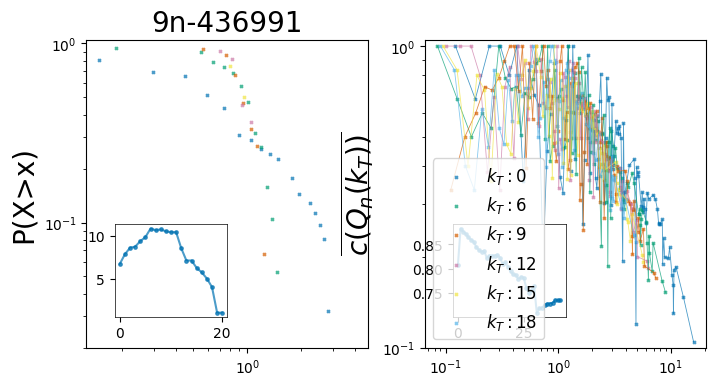

  6%|▋         | 2/32 [00:12<03:05,  6.19s/it]

Grafo 9n:436993  (umbral 5) reducido a 9.26 % en nodos y  3.27 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 21326.97it/s]


Calculating best minimal value for power law fit


 62%|██████▏   | 308/500 [00:14<00:09, 20.57it/s]


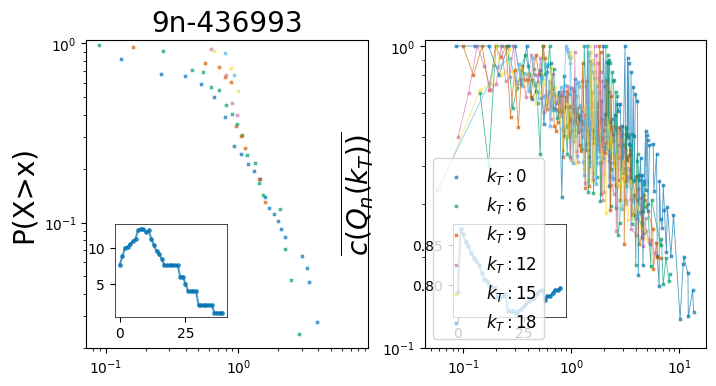

  9%|▉         | 3/32 [00:28<05:21, 11.09s/it]

Grafo 9n:436995  (umbral 5) reducido a 8.7 % en nodos y  3.03 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 11382.10it/s]


Calculating best minimal value for power law fit


 43%|████▎     | 214/500 [00:03<00:05, 56.73it/s] 


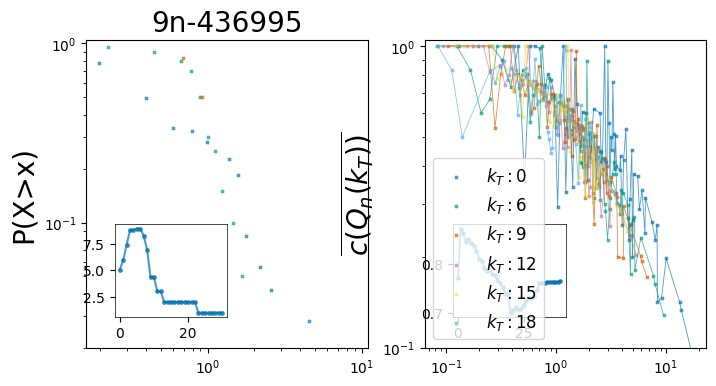

 12%|█▎        | 4/32 [00:33<04:00,  8.58s/it]

Grafo 9n:437003  (umbral 5) reducido a 5.83 % en nodos y  1.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27176.92it/s]


Calculating best minimal value for power law fit


 42%|████▏     | 211/500 [00:04<00:06, 43.46it/s] 


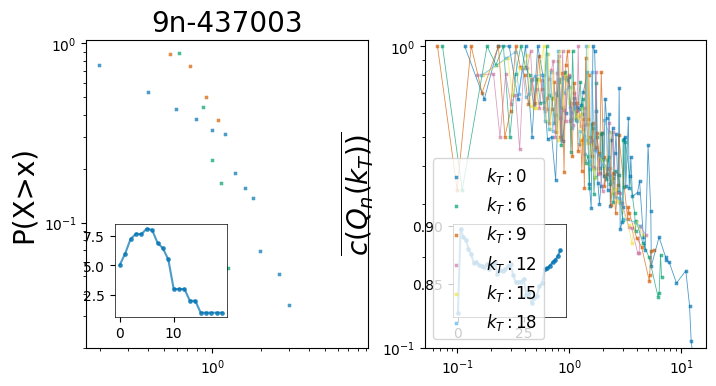

 16%|█▌        | 5/32 [00:39<03:23,  7.54s/it]

Grafo 9n:437009  (umbral 5) reducido a 5.27 % en nodos y  2.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 22114.08it/s]


Calculating best minimal value for power law fit


 39%|███▉      | 195/500 [00:03<00:05, 57.12it/s] 


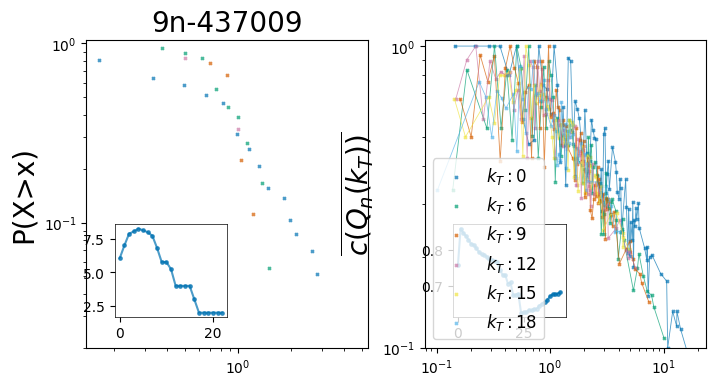

 19%|█▉        | 6/32 [00:43<02:46,  6.42s/it]

Grafo 9n:437011  (umbral 5) reducido a 7.22 % en nodos y  2.81 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 17236.87it/s]


Calculating best minimal value for power law fit


 54%|█████▍    | 272/500 [00:06<00:05, 39.89it/s]


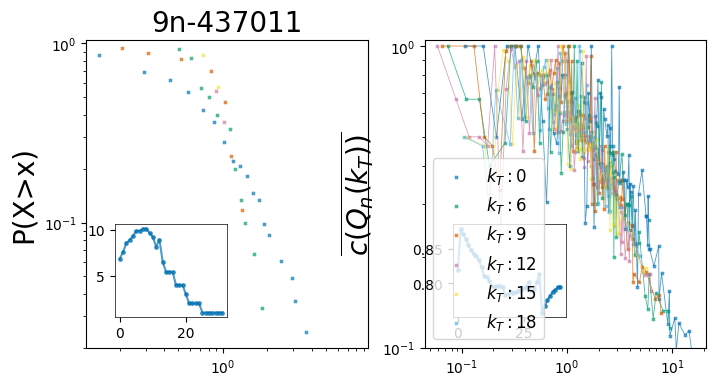

 22%|██▏       | 7/32 [00:52<02:57,  7.10s/it]

Grafo 9n:437013  (umbral 5) reducido a 7.73 % en nodos y  3.53 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 13981.01it/s]


Calculating best minimal value for power law fit


 63%|██████▎   | 315/500 [00:08<00:05, 36.75it/s]


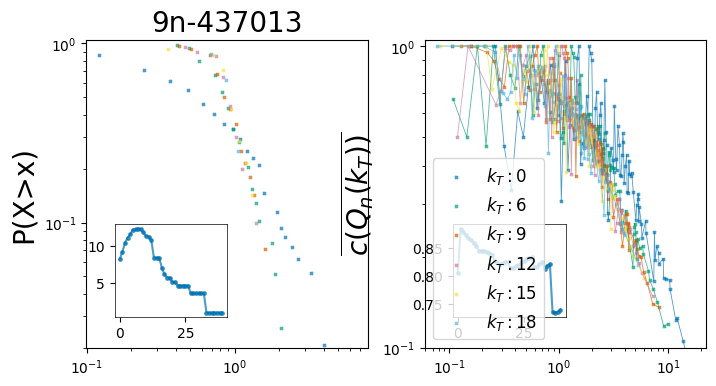

 25%|██▌       | 8/32 [01:02<03:15,  8.15s/it]

Grafo 9n:437015  (umbral 5) reducido a 10.62 % en nodos y  4.62 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27594.11it/s]


Calculating best minimal value for power law fit


 74%|███████▍  | 369/500 [00:15<00:05, 24.12it/s]


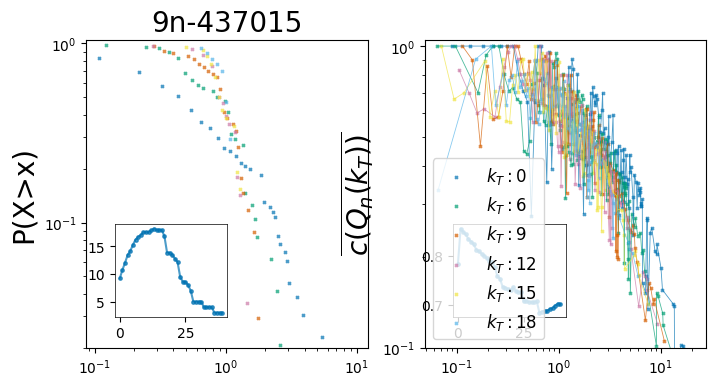

 28%|██▊       | 9/32 [01:19<04:07, 10.76s/it]

Grafo 9n:437017  (umbral 5) reducido a 9.42 % en nodos y  4.3 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27533.72it/s]


Calculating best minimal value for power law fit


 72%|███████▏  | 360/500 [00:14<00:05, 24.63it/s]


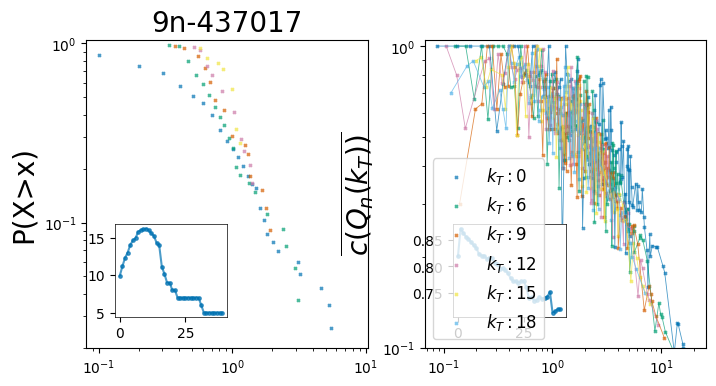

 31%|███▏      | 10/32 [01:35<04:35, 12.50s/it]

Grafo 9n:437019  (umbral 5) reducido a 8.96 % en nodos y  2.78 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28500.37it/s]


Calculating best minimal value for power law fit


 57%|█████▋    | 284/500 [00:07<00:05, 37.72it/s]


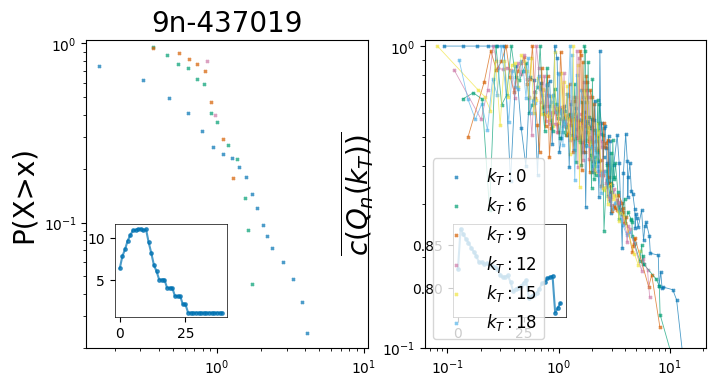

 34%|███▍      | 11/32 [01:44<04:01, 11.52s/it]

Grafo 9n:437027  (umbral 5) reducido a 5.84 % en nodos y  1.09 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18315.74it/s]


Calculating best minimal value for power law fit


 77%|███████▋  | 387/500 [01:22<00:24,  4.68it/s]


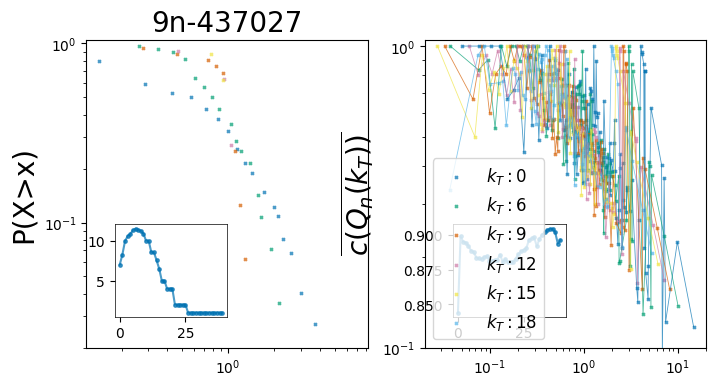

 38%|███▊      | 12/32 [03:09<11:18, 33.90s/it]

Grafo 9n:437029  (umbral 5) reducido a 6.21 % en nodos y  1.92 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18613.78it/s]


Calculating best minimal value for power law fit


 54%|█████▍    | 270/500 [00:14<00:12, 18.25it/s]


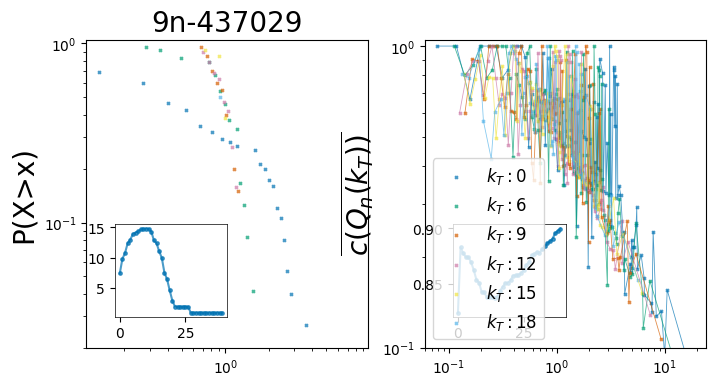

 41%|████      | 13/32 [03:26<09:05, 28.69s/it]

Grafo 9n:437031  (umbral 5) reducido a 8.49 % en nodos y  3.46 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32181.36it/s]


Calculating best minimal value for power law fit


 65%|██████▌   | 325/500 [00:12<00:06, 25.97it/s]


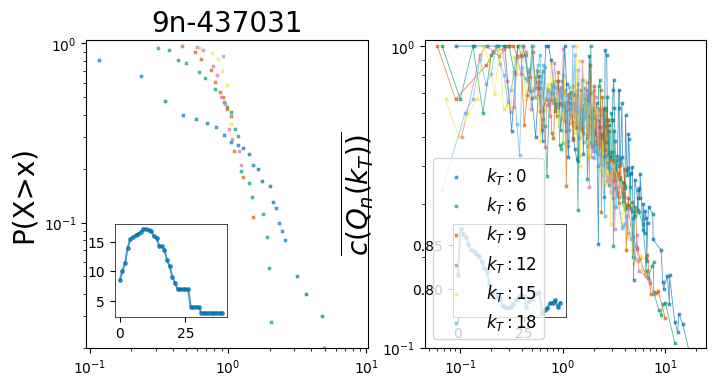

 44%|████▍     | 14/32 [03:40<07:13, 24.11s/it]

Grafo 9n:437033  (umbral 5) reducido a 6.83 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25917.43it/s]


Calculating best minimal value for power law fit


 76%|███████▋  | 382/500 [00:37<00:11, 10.31it/s]


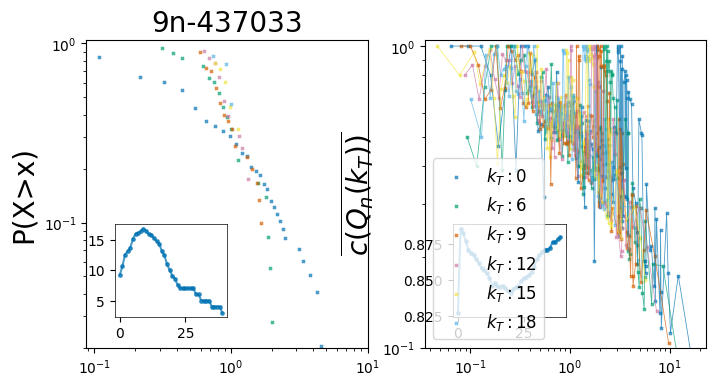

 47%|████▋     | 15/32 [04:19<08:06, 28.60s/it]

Grafo 9n:437035  (umbral 5) reducido a 10.72 % en nodos y  6.13 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 23899.17it/s]


Calculating best minimal value for power law fit


 80%|███████▉  | 399/500 [00:15<00:03, 25.30it/s]


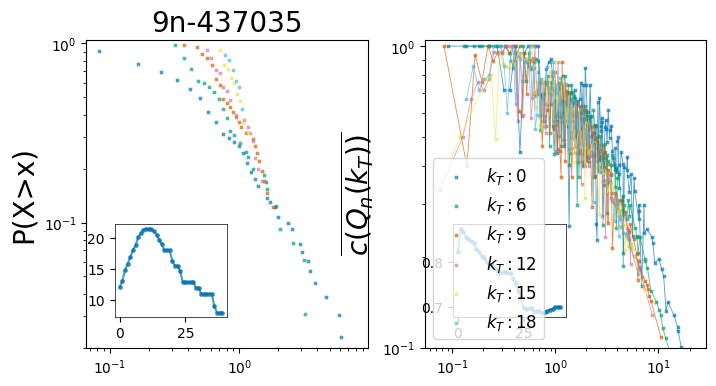

 50%|█████     | 16/32 [04:36<06:45, 25.31s/it]

Grafo 9n:437037  (umbral 5) reducido a 12.58 % en nodos y  7.1 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 18490.69it/s]


Calculating best minimal value for power law fit


100%|██████████| 500/500 [00:44<00:00, 11.21it/s]


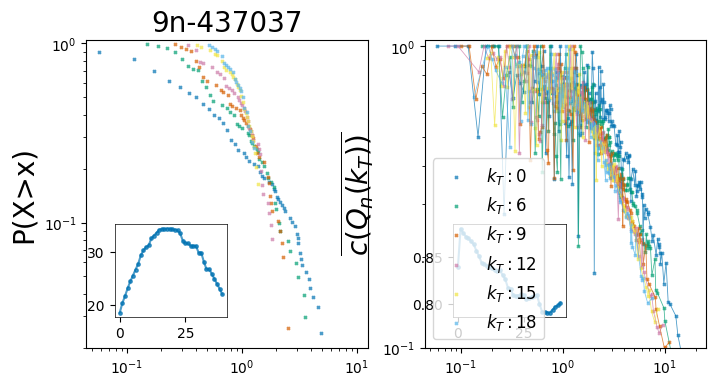

 53%|█████▎    | 17/32 [05:23<07:57, 31.82s/it]

Grafo 9n:437039  (umbral 5) reducido a 12.23 % en nodos y  7.52 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 34100.03it/s]


Calculating best minimal value for power law fit


100%|██████████| 500/500 [00:36<00:00, 13.69it/s]


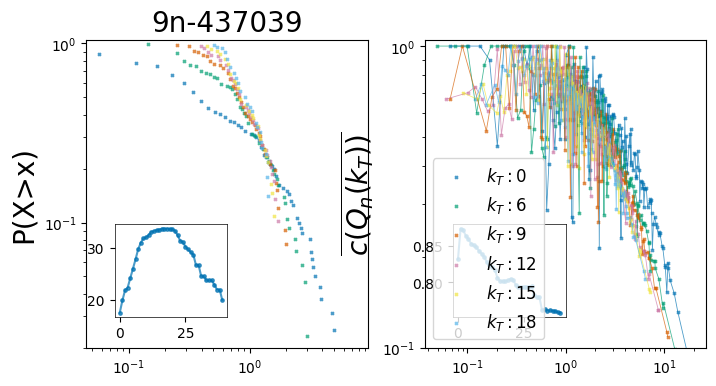

 56%|█████▋    | 18/32 [06:02<07:54, 33.87s/it]

Grafo 9n:437041  (umbral 5) reducido a 13.77 % en nodos y  5.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 22898.84it/s]


Calculating best minimal value for power law fit


100%|██████████| 500/500 [00:29<00:00, 17.24it/s]


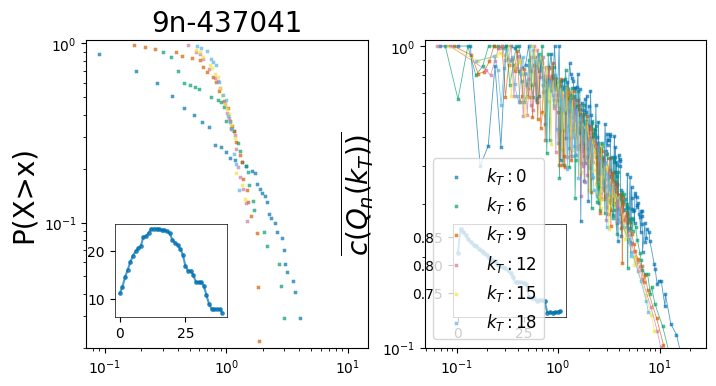

 59%|█████▉    | 19/32 [06:33<07:09, 33.02s/it]

Grafo 9n:437043  (umbral 5) reducido a 12.96 % en nodos y  5.08 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 28181.21it/s]


Calculating best minimal value for power law fit


 73%|███████▎  | 364/500 [00:16<00:06, 22.07it/s]


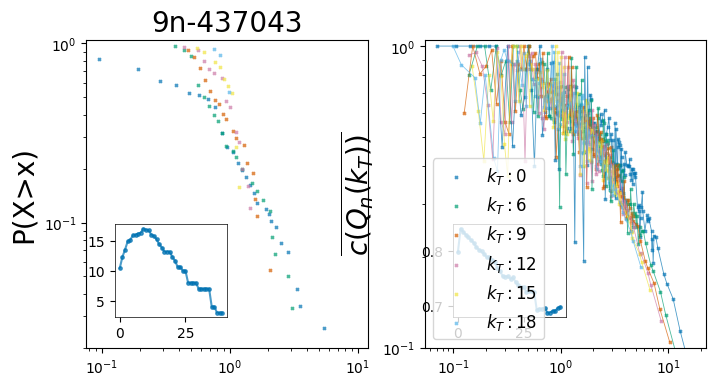

 62%|██████▎   | 20/32 [06:50<05:40, 28.35s/it]

Grafo 9n:437045  (umbral 5) reducido a 11.05 % en nodos y  2.95 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 27563.88it/s]


Calculating best minimal value for power law fit


 49%|████▉     | 246/500 [00:08<00:08, 30.55it/s]


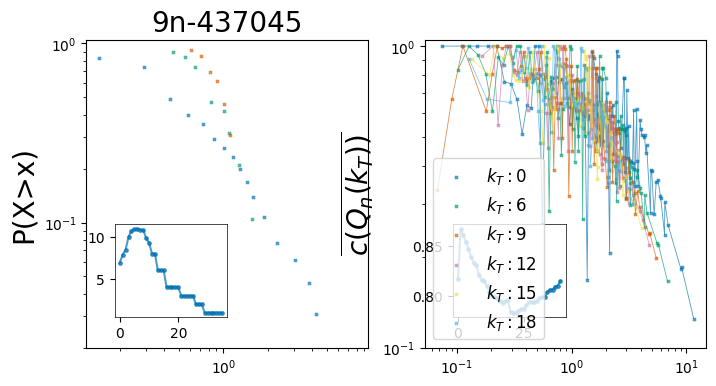

 66%|██████▌   | 21/32 [06:59<04:07, 22.51s/it]

Grafo 9n:437051  (umbral 5) reducido a 9.88 % en nodos y  3.42 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 33779.63it/s]


Calculating best minimal value for power law fit


 52%|█████▏    | 262/500 [00:09<00:08, 28.17it/s]


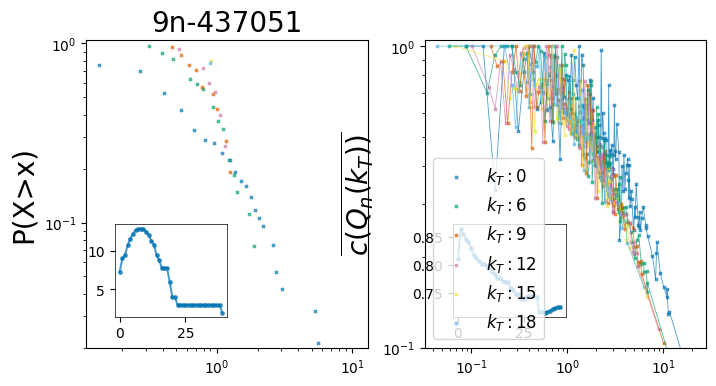

 69%|██████▉   | 22/32 [07:10<03:10, 19.04s/it]

Grafo 9n:437053  (umbral 5) reducido a 8.33 % en nodos y  2.77 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 20327.81it/s]


Calculating best minimal value for power law fit


 55%|█████▌    | 277/500 [00:07<00:05, 38.53it/s]


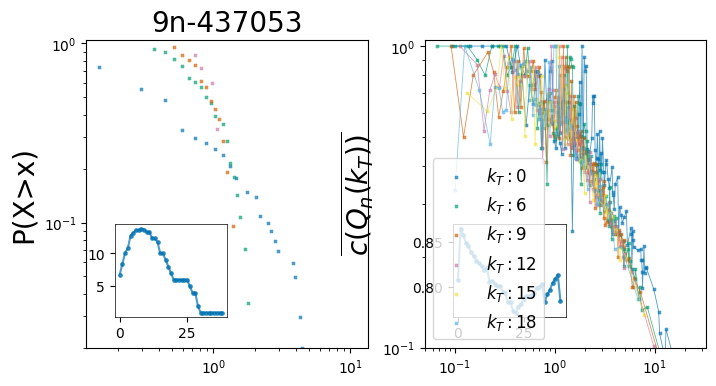

 72%|███████▏  | 23/32 [07:19<02:23, 15.95s/it]

Grafo 9n:437055  (umbral 5) reducido a 5.85 % en nodos y  2.65 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 43539.49it/s]


Calculating best minimal value for power law fit


 48%|████▊     | 242/500 [00:04<00:05, 48.66it/s] 


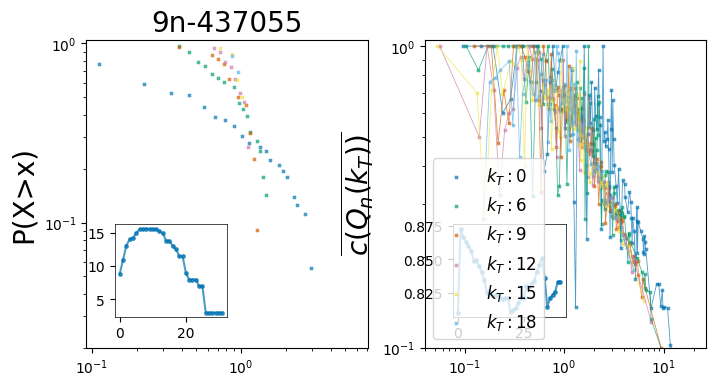

 75%|███████▌  | 24/32 [07:25<01:43, 12.97s/it]

Grafo 9n:437057  (umbral 5) reducido a 6.78 % en nodos y  3.72 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 44938.97it/s]


Calculating best minimal value for power law fit


 42%|████▏     | 208/500 [00:03<00:05, 54.61it/s] 


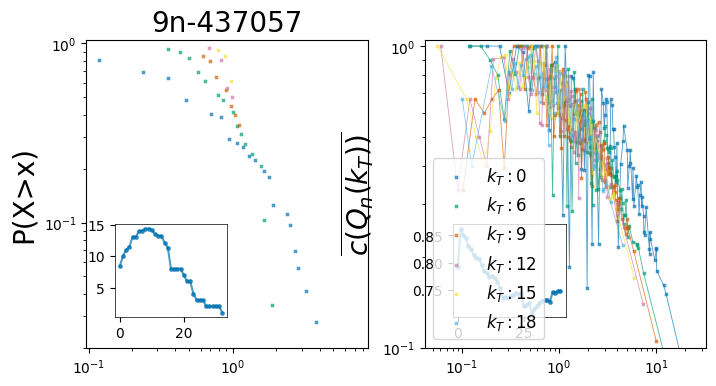

 78%|███████▊  | 25/32 [07:29<01:12, 10.37s/it]

Grafo 9n:437059  (umbral 5) reducido a 9.97 % en nodos y  4.21 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 17355.74it/s]


Calculating best minimal value for power law fit


 82%|████████▏ | 411/500 [00:13<00:02, 31.17it/s]


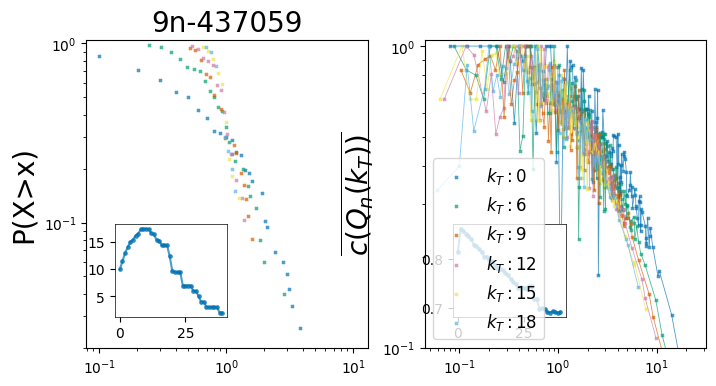

 81%|████████▏ | 26/32 [07:43<01:09, 11.54s/it]

Grafo 9n:437061  (umbral 5) reducido a 10.95 % en nodos y  5.36 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 24793.92it/s]

Calculating best minimal value for power law fit



100%|██████████| 500/500 [00:22<00:00, 22.08it/s]


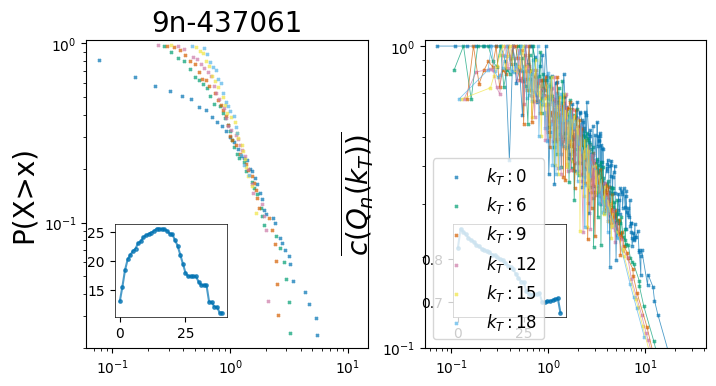

 84%|████████▍ | 27/32 [08:07<01:16, 15.25s/it]

Grafo 9n:437063  (umbral 5) reducido a 10.63 % en nodos y  5.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 39444.87it/s]


Calculating best minimal value for power law fit


 74%|███████▍  | 369/500 [00:14<00:05, 25.07it/s]


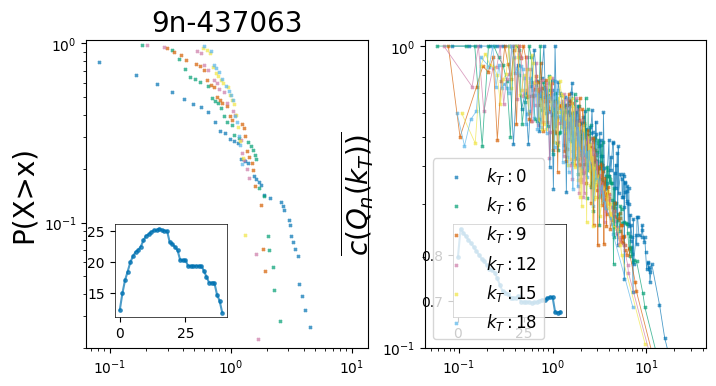

 88%|████████▊ | 28/32 [08:23<01:01, 15.47s/it]

Grafo 9n:437065  (umbral 5) reducido a 10.09 % en nodos y  2.55 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 42438.15it/s]


Calculating best minimal value for power law fit


 97%|█████████▋| 487/500 [00:49<00:01,  9.83it/s]


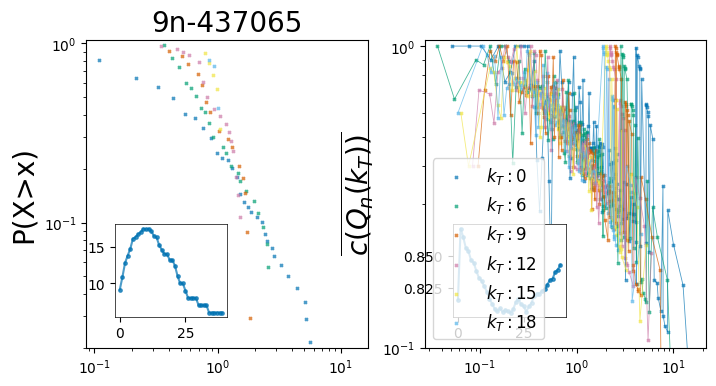

 91%|█████████ | 29/32 [09:15<01:18, 26.25s/it]

Grafo 9n:437067  (umbral 5) reducido a 10.37 % en nodos y  2.11 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38597.89it/s]


Calculating best minimal value for power law fit


 78%|███████▊  | 388/500 [00:22<00:06, 17.17it/s]


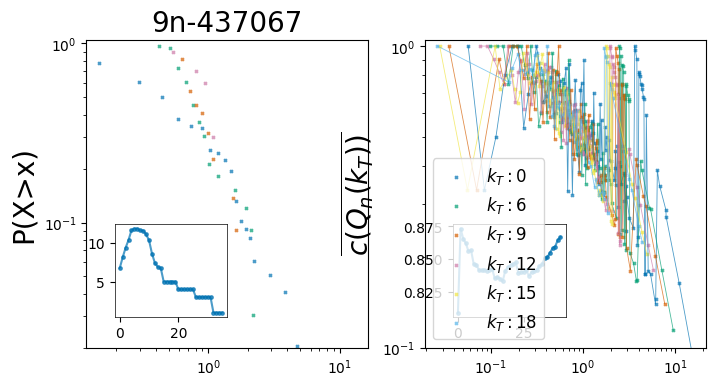

 94%|█████████▍| 30/32 [09:38<00:50, 25.48s/it]

Grafo 9n:437075  (umbral 5) reducido a 5.66 % en nodos y  0.96 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 43389.35it/s]


Calculating best minimal value for power law fit


 90%|████████▉ | 449/500 [00:46<00:05,  9.67it/s]


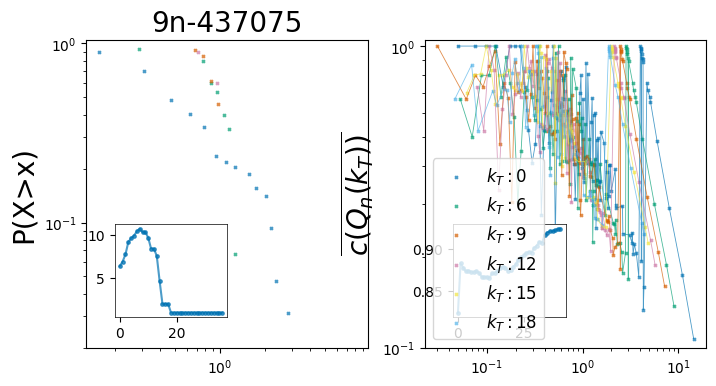

 97%|█████████▋| 31/32 [10:26<00:31, 31.99s/it]

Grafo 9n:437077  (umbral 5) reducido a 7.75 % en nodos y  3.59 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 45839.39it/s]


Calculating best minimal value for power law fit


 58%|█████▊    | 291/500 [00:03<00:02, 91.09it/s] 


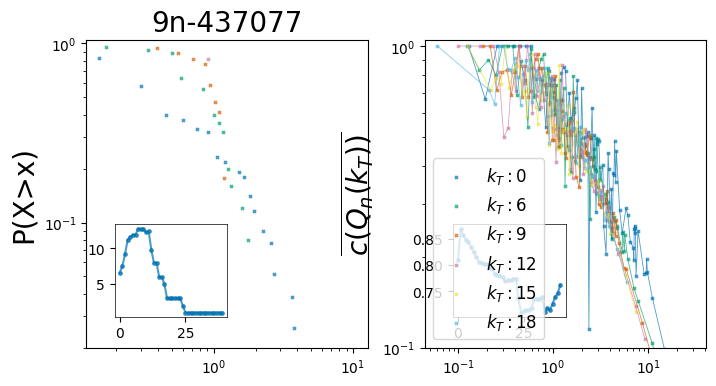

100%|██████████| 32/32 [10:30<00:00, 19.70s/it]


In [ ]:
for hora in tqdm(horas_filtr_9n):
    plot(str(hora), "9n", hour_window_9n, arr_kt_plot_9n, umbral_9n)

## CH
La hora crítica CH es: 394717

In [ ]:
hour_window_ch, arr_kt_plot_ch, umbral_ch

(2, [0, 1, 2, 3, 4, 5], 3)

  0%|          | 0/16 [00:00<?, ?it/s]

Grafo ch:394619  (umbral 3) reducido a 8.56 % en nodos y  4.98 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38187.90it/s]


Calculating best minimal value for power law fit


  6%|▋         | 1/16 [00:00<00:04,  3.26it/s]

Grafo ch:394621  (umbral 3) reducido a 10.33 % en nodos y  6.95 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 40394.58it/s]


Calculating best minimal value for power law fit


 12%|█▎        | 2/16 [00:00<00:07,  1.92it/s]

Grafo ch:394623  (umbral 3) reducido a 9.01 % en nodos y  4.99 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 38130.04it/s]


Calculating best minimal value for power law fit


 19%|█▉        | 3/16 [00:02<00:10,  1.30it/s]

Grafo ch:394625  (umbral 3) reducido a 14.06 % en nodos y  8.81 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 29852.70it/s]


Calculating best minimal value for power law fit


 25%|██▌       | 4/16 [00:03<00:14,  1.19s/it]

Grafo ch:394627  (umbral 3) reducido a 11.62 % en nodos y  7.97 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 36157.79it/s]


Calculating best minimal value for power law fit


 31%|███▏      | 5/16 [00:06<00:19,  1.73s/it]

Grafo ch:394629  (umbral 3) reducido a 10.06 % en nodos y  6.88 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 32513.98it/s]


Calculating best minimal value for power law fit


 38%|███▊      | 6/16 [00:09<00:19,  1.98s/it]

Grafo ch:394643  (umbral 3) reducido a 8.79 % en nodos y  6.14 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 26159.90it/s]


Calculating best minimal value for power law fit


 44%|████▍     | 7/16 [00:09<00:14,  1.58s/it]

Grafo ch:394649  (umbral 3) reducido a 8.52 % en nodos y  5.4 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 13873.11it/s]


Calculating best minimal value for power law fit


 50%|█████     | 8/16 [00:10<00:10,  1.32s/it]

Grafo ch:394653  (umbral 3) reducido a 6.55 % en nodos y  2.5 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 12300.01it/s]


Calculating best minimal value for power law fit


 56%|█████▋    | 9/16 [00:12<00:09,  1.41s/it]

Grafo ch:394671  (umbral 3) reducido a 9.23 % en nodos y  9.36 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 33200.30it/s]


Calculating best minimal value for power law fit


 62%|██████▎   | 10/16 [00:13<00:08,  1.33s/it]

Grafo ch:394673  (umbral 3) reducido a 9.47 % en nodos y  7.1 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 29059.84it/s]


Calculating best minimal value for power law fit


 69%|██████▉   | 11/16 [00:14<00:07,  1.41s/it]

Grafo ch:394715  (umbral 3) reducido a 8.19 % en nodos y  6.97 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 25497.29it/s]


Calculating best minimal value for power law fit


 75%|███████▌  | 12/16 [00:15<00:04,  1.16s/it]

Grafo ch:394717  (umbral 3) reducido a 13.31 % en nodos y  7.4 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 31615.36it/s]


Calculating best minimal value for power law fit


 81%|████████▏ | 13/16 [00:17<00:04,  1.50s/it]

Grafo ch:394719  (umbral 3) reducido a 12.63 % en nodos y  7.52 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 16163.02it/s]


Calculating best minimal value for power law fit


 88%|████████▊ | 14/16 [00:20<00:03,  1.73s/it]

Grafo ch:394721  (umbral 3) reducido a 11.67 % en nodos y  7.84 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 33112.93it/s]


Calculating best minimal value for power law fit


 94%|█████████▍| 15/16 [00:21<00:01,  1.62s/it]

Grafo ch:394723  (umbral 3) reducido a 5.97 % en nodos y  4.25 % en aristas.


100%|██████████| 6/6 [00:00<00:00, 20936.63it/s]


Calculating best minimal value for power law fit


100%|██████████| 16/16 [00:22<00:00,  1.41s/it]


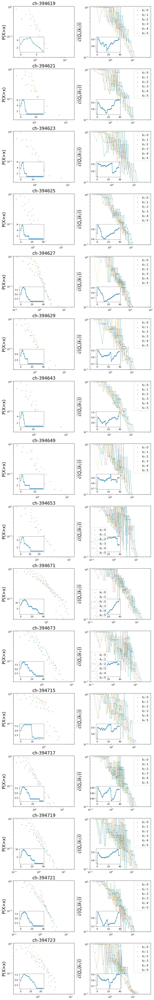

In [ ]:
num_horas = len(horas_filtr_ch)
plt.style.use('seaborn-v0_8-colorblind')
fig, axs = plt.subplots(num_horas, 2, figsize=(10, 4 * num_horas))

for idx, hora in enumerate(tqdm(horas_filtr_ch)):
    plot(str(hora), "ch", hour_window_ch, arr_kt_plot_ch, umbral_ch, axs[idx])
for ax_pair in axs:
    ax_pair[1].legend(prop={'size': 12})
plt.tight_layout()
plt.show()